##### Name:- Mansi Nagpal
Email:- mansinagpal786@gmail.com

Phase 3

1) Now make only 1 data frame of two CSV files using the join operation of pandas and start doing EDA.

2) Do the complete EDA in detail to explore the insights of data and write detailed observations of each analysis.



Phase 4

1) Write the complete Machine learning code to make predictions of votes and gross collection. Use appropriate models on their label basis. Remember you need to make 2 different predictions: vote and gross collection.

2) Apply all the best techniques of scaling, and hyperparameter tuning, and avoid underfitting or overfitting (bias/variance)

3) At the end save the best model and convey on which basis you have chosen that model.  

###### Import Packages

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns
sns.set(style='whitegrid')
import warnings 
warnings.filterwarnings('ignore')
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression,LinearRegression,Lasso,Ridge
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
#importing other libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,accuracy_score
#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Moudles related to feature selection
from sklearn.feature_selection import RFE,SelectKBest,f_classif

In [4]:
df1 = pd.read_csv('Movies_1.csv')
df1.head()

,Sno,Name,Director_1,Director_2,Director_3,Duration,Metascore,Year,Ratings
0,0,Spider-Man: Across the Spider-Verse,Joaquim Dos San,Kemp Powers,Justin K. Thompson,140,86.0,2023,9.0
1,1,The Dark Knight,Christopher Nolan,NaN,NaN,152,84.0,2008,9.0
2,2,The Lord of the Rings: The Return of the King,Peter Jackson,NaN,NaN,201,94.0,2003,9.0
3,3,Inception,Christopher Nolan,NaN,NaN,148,74.0,2010,8.8
4,4,The Lord of the Rings: The Fellowship of the Ring,Peter Jackson,NaN,NaN,178,92.0,2001,8.8


In [5]:
df2 = pd.read_csv('Movies_2.csv')
df2.head()

,Popular,Name_0,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross,Certification
0,1,Spider-Man: Across the Spider-Verse,hameik Moore,Hailee Steinfeld,Brian Tyree Henry,Luna Lauren Velez,125082,Animation,Action,Adventure,NaN,U
1,84,The Dark Knight,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2725569,Action,Crime,Drama,534.86,UA
2,324,The Lord of the Rings: The Return of the King,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1891064,Action,Adventure,Drama,377.85,U
3,80,Inception,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2419065,Action,Adventure,Sci-Fi,292.58,UA
4,170,The Lord of the Rings: The Fellowship of the Ring,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,1919680,Action,Adventure,Drama,315.54,U


In [8]:
import pandas as pd
files = ['Movies_1.csv', 'Movies_2.csv']
df = pd.DataFrame()
for file in files:
    data = pd.read_csv(file)
    df = pd.concat([df, data], axis=1)
    #Drop the duplicated column
df.to_csv('merged_files.csv', index=False)

In [10]:
df

,Sno,Name,Director_1,Director_2,Director_3,Duration,Metascore,Year,Ratings,Popular,...,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross,Certification
0,0,Spider-Man: Across the Spider-Verse,Joaquim Dos San,Kemp Powers,Justin K. Thompson,140,86.0,2023,9.0,1,...,hameik Moore,Hailee Steinfeld,Brian Tyree Henry,Luna Lauren Velez,125082,Animation,Action,Adventure,NaN,U
1,1,The Dark Knight,Christopher Nolan,NaN,NaN,152,84.0,2008,9.0,84,...,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2725569,Action,Crime,Drama,534.86,UA
2,2,The Lord of the Rings: The Return of the King,Peter Jackson,NaN,NaN,201,94.0,2003,9.0,324,...,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1891064,Action,Adventure,Drama,377.85,U
3,3,Inception,Christopher Nolan,NaN,NaN,148,74.0,2010,8.8,80,...,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2419065,Action,Adventure,Sci-Fi,292.58,UA
4,4,The Lord of the Rings: The Fellowship of the Ring,Peter Jackson,NaN,NaN,178,92.0,2001,8.8,170,...,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,1919680,Action,Adventure,Drama,315.54,U
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1745,1745,Heropanti 2,Ahmed Khan,NaN,NaN,145,NaN,2022,2.5,0,...,Tiger Shroff,Nawazuddin Siddiqui,Tara Sutaria,Amber Doig-Thorne,27009,Action,Comedy,Crime,NaN,UA
1746,1746,Laxmii,Raghava Lawren,Balakrishnan Thevar,NaN,141,NaN,2020,2.5,0,...,Akshay Kum,Kiara Advani,Sharad Kelkar,Ashwini Kalsekar,58055,Action,Comedy,Horror,NaN,UA 16+
1747,1747,Alone in the Dark,Uwe Boll,NaN,NaN,99,9.0,2005,2.4,0,...,Christian Slate,Tara Reid,Stephen Dorff,Frank C. Turner,46404,Action,Horror,Sci-Fi,5.18,A
1748,1748,The Prototype,Marcelo Grion,NaN,NaN,97,NaN,2022,2.4,0,...,Mark Vasconcello,Frank Spinelli,Victoria De Mare,Juan Antonio Devoto,35595,Action,Sci-Fi,Thriller,NaN,NaN


## EDA

In [11]:
# Shape of the dataset
df.shape

(1750, 21)

In [12]:
# check dulpicated records
df.duplicated().sum()

0

In [13]:
df.isin([' ','NA','-']).sum().any()

False

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1750 entries, 0 to 1749
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Name           1750 non-null   object 
 1   Director_1     1750 non-null   object 
 2   Director_2     1750 non-null   object 
 3   Director_3     1750 non-null   object 
 4   Duration       1750 non-null   int64  
 5   Metascore      1750 non-null   float64
 6   Year           1750 non-null   int64  
 7   Ratings        1750 non-null   float64
 8   Popular        1750 non-null   int64  
 9   Name_0         1750 non-null   object 
 10  Stars_1        1750 non-null   object 
 11  Stars_2        1750 non-null   object 
 12  Stars_3        1750 non-null   object 
 13  Stars_4        1750 non-null   object 
 14  Votes          1750 non-null   int64  
 15  Genre_1        1750 non-null   object 
 16  Genre_2        1750 non-null   object 
 17  Genre_3        1750 non-null   object 
 18  Gross   

In [36]:
# Remove Serial no column for high cardinality
df.drop('Name_0',axis=1,inplace=True)

KeyError: "['Name_0'] not found in axis"

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1750 entries, 0 to 1749
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Name           1750 non-null   object 
 1   Director_1     1750 non-null   object 
 2   Director_2     1750 non-null   object 
 3   Director_3     1750 non-null   object 
 4   Duration       1750 non-null   int64  
 5   Metascore      1750 non-null   float64
 6   Year           1750 non-null   int64  
 7   Ratings        1750 non-null   float64
 8   Popular        1750 non-null   int64  
 9   Stars_1        1750 non-null   object 
 10  Stars_2        1750 non-null   object 
 11  Stars_3        1750 non-null   object 
 12  Stars_4        1750 non-null   object 
 13  Votes          1750 non-null   int64  
 14  Genre_1        1750 non-null   object 
 15  Genre_2        1750 non-null   object 
 16  Genre_3        1750 non-null   object 
 17  Gross          1472 non-null   float64
 18  Certific

In [38]:
df.columns

Index(['Name', 'Director_1', 'Director_2', 'Director_3', 'Duration',
       'Metascore', 'Year', 'Ratings', 'Popular', 'Stars_1', 'Stars_2',
       'Stars_3', 'Stars_4', 'Votes', 'Genre_1', 'Genre_2', 'Genre_3', 'Gross',
       'Certification'],
      dtype='object')

In [39]:
df.isnull().sum()

Name               0
Director_1         0
Director_2         0
Director_3         0
Duration           0
Metascore          0
Year               0
Ratings            0
Popular            0
Stars_1            0
Stars_2            0
Stars_3            0
Stars_4            0
Votes              0
Genre_1            0
Genre_2            0
Genre_3            0
Gross            278
Certification      0
dtype: int64

##### These following features: (Director_2,Director_3,Metascore,Genre_2,Genre_3,Gross,Certification,Popular) have NULL values.

In [40]:
for i in df.columns:
    print(df[i].value_counts())
    print('**********************************')

Teenage Mutant Ninja Turtles               2
RoboCop                                    2
Total Recall                               2
Tron                                       2
Get Carter                                 2
                                          ..
Dragged Across Concrete                    1
A Knight's Tale                            1
Pacific Rim                                1
Star Wars: Episode VIII - The Last Jedi    1
House of the Dead                          1
Name: Name, Length: 1719, dtype: int64
**********************************
Michael Bay         15
Tony S              13
Steven Spielberg    13
Robert Rodriguez    12
Antoine Fuqua       12
                    ..
Neil Burg            1
Rob Marshall         1
Andrew Stanton       1
Adam McKay           1
Marcelo Grion        1
Name: Director_1, Length: 929, dtype: int64
**********************************
NA                     1644
Joe Russo                 5
Lilly Wachowski           5
Espen Sandberg 

###### G: General Audiences PG: Parental Guidance Suggested PG-13: Parents Strongly Cautioned R: Restricted (Requires accompanying parent or adult guardian for viewers under 17) NC-17: No One 17 and Under Admitted

In [41]:
# Modify the Certification values
# Define the list for replacement
replace_list_18= ['18+', '18 +', '18TC']
replacement_value_18= '18'
replace_list_17= ['17+', 'NC-17']
replacement_value_17= '17'
replace_list_16= ['16+', '16 +']
replacement_value_16= '16'
replace_list_15= ['PG 15', 'PG-15']
replacement_value_15= '15'
replace_list_13= ['13+', '13 +','M','M/PG']
replacement_value_13= '13'
replace_list_12= ['12+', 'R-12']
replacement_value_12= '12'

In [42]:
# Replace multiple values using the list
df['Certification'] = df.Certification.replace(replace_list_18, replacement_value_18)
df['Certification'] = df.Certification.replace(replace_list_17, replacement_value_17)
df['Certification'] = df.Certification.replace(replace_list_16, replacement_value_16)
df['Certification'] = df.Certification.replace(replace_list_15, replacement_value_15)
df['Certification'] = df.Certification.replace(replace_list_13, replacement_value_13)
df['Certification'] = df.Certification.replace(replace_list_12, replacement_value_12)
df['Certification'] =df.Certification.replace('(Banned)','R')
df['Certification'] =df.Certification.replace('8+','8').replace('7+','7')

In [43]:
# Check the Certification feature again
df.Certification.value_counts()

UA           593
A            401
U            255
R            207
Not Rated     89
PG-13         78
18            36
16            26
PG            16
13            14
UA 16+        10
UA 13+         7
15+            6
7              4
12             4
U/A 16+        1
U/A            1
UA 7+          1
All            1
Name: Certification, dtype: int64

In [44]:
df.Year.max()

2023

In [45]:
# Handling Missing values in dataset.
df['Certification'] =df.Certification.replace(np.nan,'Not Rated')
df.Popular.fillna(0.0,inplace=True)
df.Director_2.fillna('NA',inplace=True)
df.Director_3.fillna('NA',inplace=True)
df.Stars_2.fillna('NA',inplace=True)
df.Stars_3.fillna('NA',inplace=True)
df.Stars_4.fillna('NA',inplace=True)
df.Genre_2.fillna('NA',inplace=True)
df.Genre_3.fillna('NA',inplace=True)

# Using knn imputer for both metascore and gross
from sklearn.impute  import KNNImputer
imputer=KNNImputer(n_neighbors=5)
data=df[['Ratings','Votes','Metascore']]

In [46]:
import sklearn
from sklearn.impute import SimpleImputer

In [47]:
from sklearn.preprocessing import StandardScaler,PowerTransformer,MinMaxScaler,PolynomialFeatures

In [48]:
# Initialize MinMaxScaler
scaler = MinMaxScaler()

In [49]:
# Use some features of the data
data=df[['Ratings','Votes','Metascore']]
# Perform Min-Max Scaling
scaled_data = scaler.fit_transform(data)

# Fit the imputer on the data
imputer.fit(scaled_data)
# Replacing the missing values
data=imputer.transform(scaled_data)

In [50]:
# Reverse the scaling
unscaled_data = scaler.inverse_transform(data)

In [51]:
df['Metascore']=unscaled_data[:,2]

In [52]:
df.Metascore

0       86.0
1       84.0
2       94.0
3       74.0
4       92.0
        ... 
1745    19.2
1746    19.2
1747     9.0
1748    19.2
1749    15.0
Name: Metascore, Length: 1750, dtype: float64

In [53]:
# Check the null values again
df.isnull().sum()

Name               0
Director_1         0
Director_2         0
Director_3         0
Duration           0
Metascore          0
Year               0
Ratings            0
Popular            0
Stars_1            0
Stars_2            0
Stars_3            0
Stars_4            0
Votes              0
Genre_1            0
Genre_2            0
Genre_3            0
Gross            278
Certification      0
dtype: int64

In [54]:
# Use later when predicting the gross feature as a target
df_gross=df.dropna()
df_gross.shape

(1472, 19)

In [55]:
# Using knn imputer for both metascore and gross
from sklearn.impute  import KNNImputer
imputer=KNNImputer(n_neighbors=5)
# Initialize MinMaxScaler
scaler = MinMaxScaler()
# Use some features of the data
data=df[['Ratings','Votes','Gross']]
# Perform Min-Max Scaling
scaled_data = scaler.fit_transform(data)

# Fit the imputer on the data
imputer.fit(scaled_data)
# Replacing the missing values
data=imputer.transform(scaled_data)

In [56]:
# Reverse the scaling
unscaled_data = scaler.inverse_transform(data)

In [57]:
df['Gross']=unscaled_data[:,2]

In [58]:
df.Metascore

0       86.0
1       84.0
2       94.0
3       74.0
4       92.0
        ... 
1745    19.2
1746    19.2
1747     9.0
1748    19.2
1749    15.0
Name: Metascore, Length: 1750, dtype: float64

In [59]:
df.Gross

0         8.718
1       534.860
2       377.850
3       292.580
4       315.540
         ...   
1745      9.732
1746      9.732
1747      5.180
1748      9.732
1749     10.250
Name: Gross, Length: 1750, dtype: float64

In [60]:
df.Votes

0        125082
1       2725569
2       1891064
3       2419065
4       1919680
         ...   
1745      27009
1746      58055
1747      46404
1748      35595
1749      38040
Name: Votes, Length: 1750, dtype: int64

In [61]:
df.tail()

,Name,Director_1,Director_2,Director_3,Duration,Metascore,Year,Ratings,Popular,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross,Certification
1745,Heropanti 2,Ahmed Khan,NA,NA,145,19.2,2022,2.5,0,Tiger Shroff,Nawazuddin Siddiqui,Tara Sutaria,Amber Doig-Thorne,27009,Action,Comedy,Crime,9.732,UA
1746,Laxmii,Raghava Lawren,Balakrishnan Thevar,NA,141,19.2,2020,2.5,0,Akshay Kum,Kiara Advani,Sharad Kelkar,Ashwini Kalsekar,58055,Action,Comedy,Horror,9.732,UA 16+
1747,Alone in the Dark,Uwe Boll,NA,NA,99,9.0,2005,2.4,0,Christian Slate,Tara Reid,Stephen Dorff,Frank C. Turner,46404,Action,Horror,Sci-Fi,5.180,A
1748,The Prototype,Marcelo Grion,NA,NA,97,19.2,2022,2.4,0,Mark Vasconcello,Frank Spinelli,Victoria De Mare,Juan Antonio Devoto,35595,Action,Sci-Fi,Thriller,9.732,Not Rated
1749,House of the Dead,Uwe Boll,NA,NA,90,15.0,2003,2.1,0,Jonathan Cherry,Tyron Leitso,Clint Howard,Ona Grauer,38040,Action,Adventure,Horror,10.250,A


In [62]:
df.describe()

,Duration,Metascore,Year,Ratings,Popular,Votes,Gross
count,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1.750000e+03,1750.000000
mean,115.380000,53.897829,2006.085143,6.493257,1514.385143,1.811948e+05,68.877072
std,21.763586,16.453597,13.252664,0.965145,1551.649944,2.369641e+05,96.764033
min,45.000000,9.000000,1924.000000,2.100000,0.000000,2.504200e+04,0.000000
25%,100.000000,42.000000,2000.000000,5.900000,0.000000,4.742900e+04,15.252000
50%,112.000000,54.000000,2009.000000,6.500000,1069.500000,9.645400e+04,36.225000
75%,126.750000,66.000000,2016.000000,7.100000,2701.500000,2.119398e+05,80.152500
max,321.000000,98.000000,2023.000000,9.000000,4992.000000,2.725569e+06,936.660000


In [63]:
# split train data to continous and categorical varaiables.
num=df.select_dtypes(include=['float64','int64'])
cat=df.select_dtypes(include=['object'])

# split train data to continous and categorical varaiables.
num_gross=df_gross.select_dtypes(include=['float64','int64'])
cat_gross=df_gross.select_dtypes(include=['object'])

In [64]:
# Descriptive analysis for categorical data
cat.describe(include='O')

,Name,Director_1,Director_2,Director_3,Stars_1,Stars_2,Stars_3,Stars_4,Genre_1,Genre_2,Genre_3,Certification
count,1750,1750,1750,1750,1750,1750,1750,1750,1750,1750,1750,1750
unique,1719,929,83,8,724,1165,1328,1444,2,16,19,19
top,Teenage Mutant Ninja Turtles,Michael Bay,NA,NA,ylvester Stallone,Samuel L. Jackson,Samuel L. Jackson,Vincent D'Onofrio,Action,Adventure,Drama,UA
freq,2,15,1644,1743,26,14,7,5,1680,639,331,593


##### Univariate Analysis

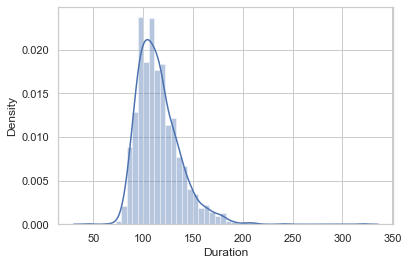

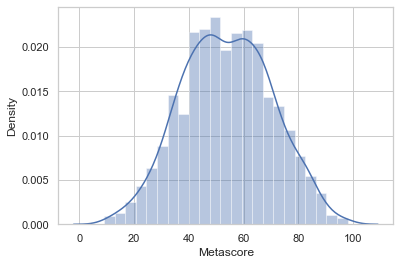

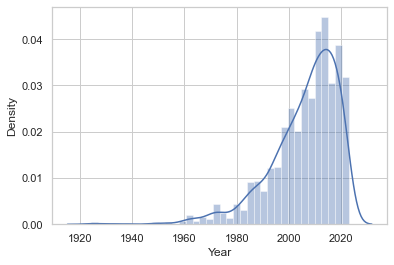

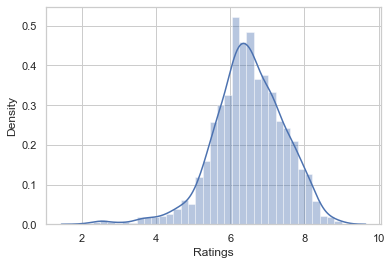

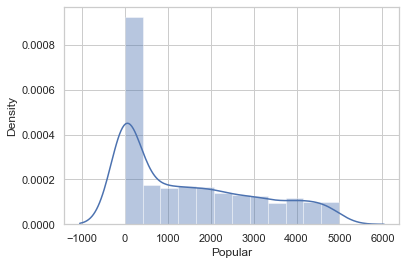

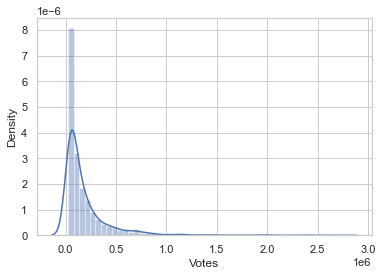

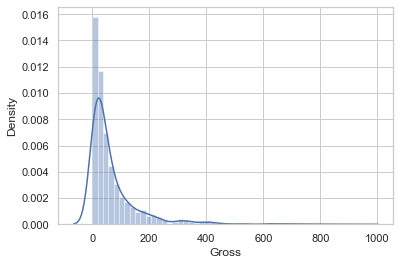

In [65]:
# Check Normality of continous data
for i in num.columns:
    sns.distplot(num[i])
    plt.show()

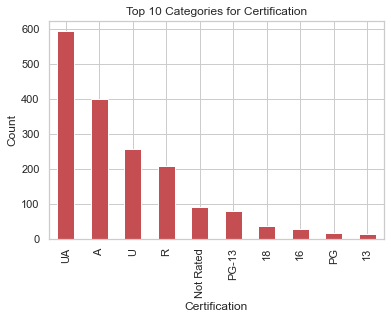

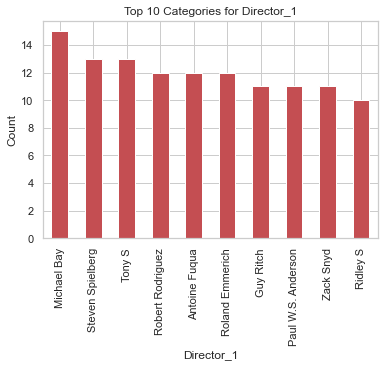

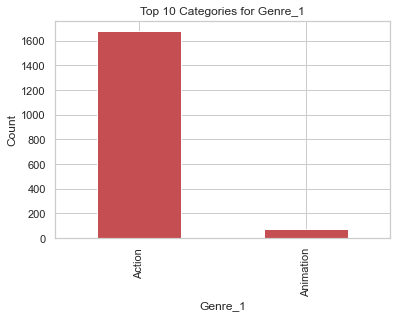

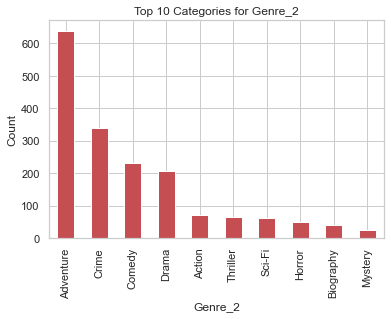

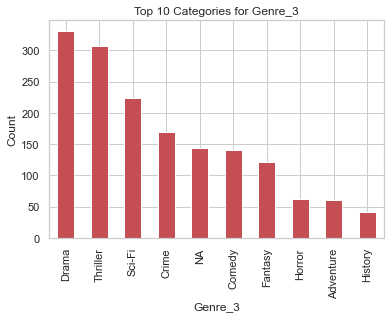

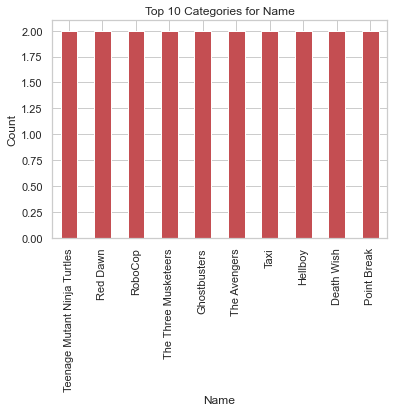

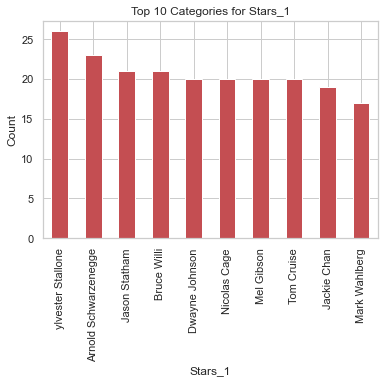

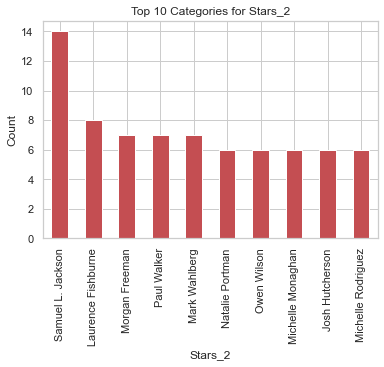

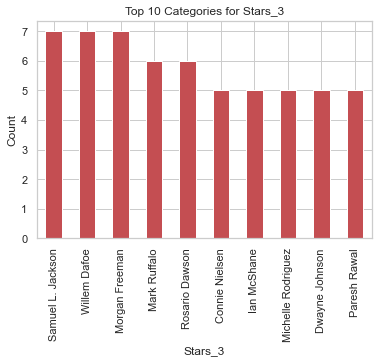

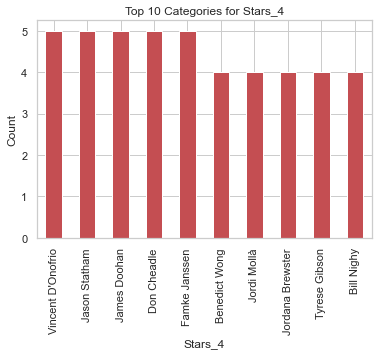

In [66]:
# Check count of categorical data for the best 7
for i in cat.columns.difference(['Director_2','Director_3']):
    cat[i].value_counts().sort_values(ascending=False).head(10).plot(kind='bar', color='r')
    plt.xlabel(i)
    plt.ylabel('Count')
    plt.title(f'Top 10 Categories for {i}')
    plt.show()

###### Bivariate analysis

In [67]:
# top 20 rated movies according to  Popular|User Rating|Number of Votes/Metascore/Runtime
for col in ['Popular','Ratings','Votes','Metascore','Duration','Gross']:
    top_rated= df.sort_values(by=col ,ascending=False).head(20)
    figure=px.bar(top_rated,x='Name',y=col)
    figure.show()


In [68]:
for i in df.columns:
    print(f'The value counts for attribute {i} is-\n {df[i].value_counts()}')
    print('\n')

The value counts for attribute Name is-
 Teenage Mutant Ninja Turtles               2
RoboCop                                    2
Total Recall                               2
Tron                                       2
Get Carter                                 2
                                          ..
Dragged Across Concrete                    1
A Knight's Tale                            1
Pacific Rim                                1
Star Wars: Episode VIII - The Last Jedi    1
House of the Dead                          1
Name: Name, Length: 1719, dtype: int64


The value counts for attribute Director_1 is-
 Michael Bay         15
Tony S              13
Steven Spielberg    13
Robert Rodriguez    12
Antoine Fuqua       12
                    ..
Neil Burg            1
Rob Marshall         1
Andrew Stanton       1
Adam McKay           1
Marcelo Grion        1
Name: Director_1, Length: 929, dtype: int64


The value counts for attribute Director_2 is-
 NA                     1644
Jo

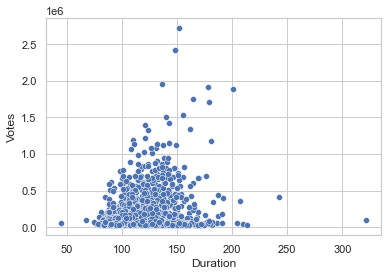

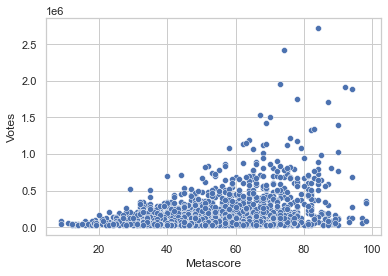

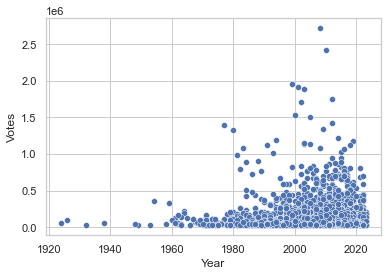

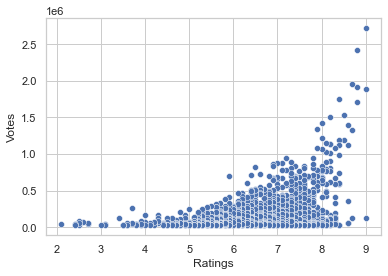

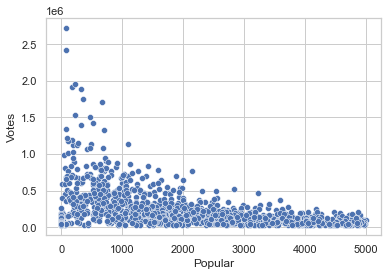

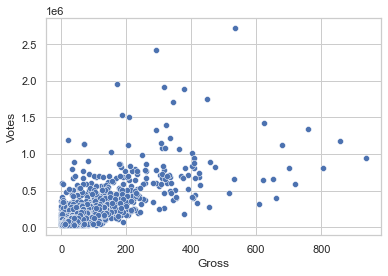

In [69]:
# Scatter plot between continous features and target variable (Votes) 
for i in num.columns.drop(['Votes']):
    sns.scatterplot(x=i, y='Votes', data=num)
    plt.show()

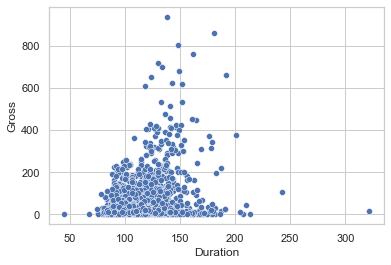

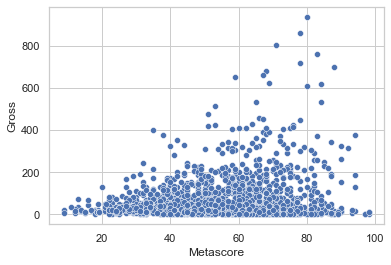

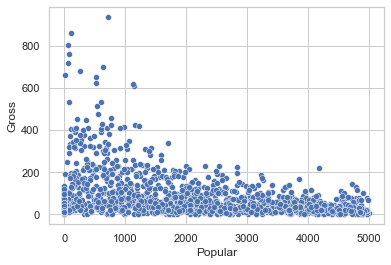

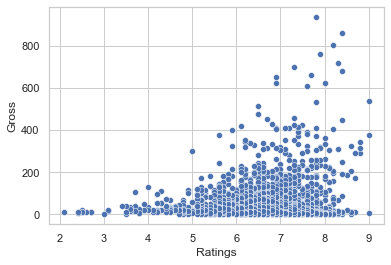

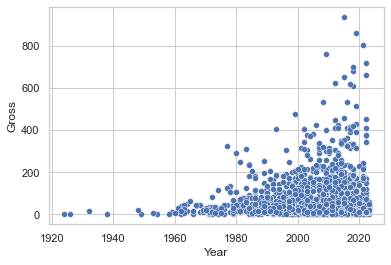

In [70]:
# Scatter plot between continous features and target variable (Votes) 
for i in num.columns.difference(['Votes','Gross']):
    sns.scatterplot(x=i, y='Gross', data=num)
    plt.show()

In [71]:
# Checking the relation between year and  Targets variables

# Sort the DataFrame by the x-axis column in ascending order
df_sorted = df.sort_values(by='Year')

# Create the plotly bar plot
fig = px.line(df_sorted, x='Year', y='Votes',width=1500, height=600)

# Display the plot
fig.show()

In [72]:
# Sort the DataFrame by the x-axis column in ascending order
df_sorted = df.sort_values(by='Year')

# Create the plotly bar plot
fig = px.line(df_sorted, x='Year', y='Gross',width=1500, height=600)

# Display the plot
fig.show()

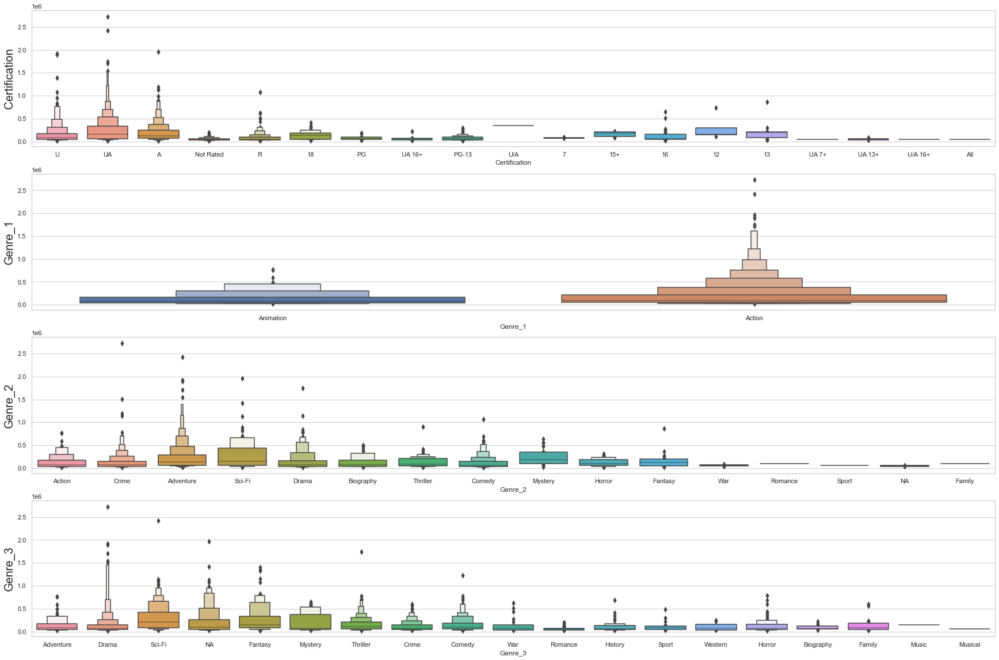

In [73]:
# Relationship between categorical columns and Target variable (Votes)

plt.figure(figsize=(30,20), facecolor='white')
plotnumber = 1

for i in ['Certification', 'Genre_1', 'Genre_2','Genre_3']:
    if plotnumber<=4 :
        ax = plt.subplot(4,1,plotnumber)
        sns.boxenplot(y=df.Votes,x=df[i])
        plt.ylabel(i,fontsize=20)
       
    plotnumber+=1
plt.show()

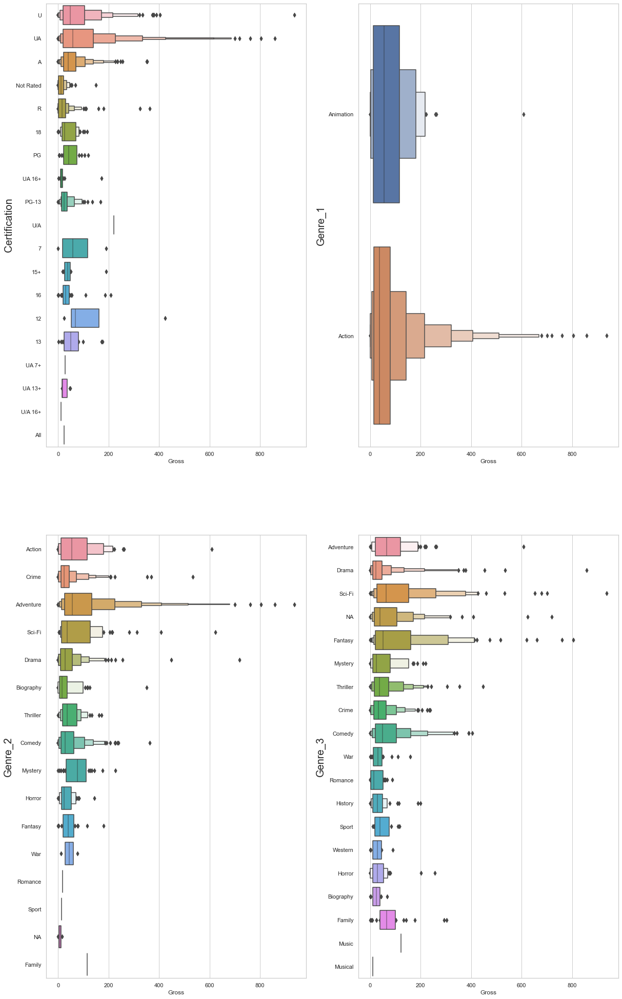

In [74]:
# Relationship between categorical columns and Target variable (Gross)

plt.figure(figsize=(20,35), facecolor='white')
plotnumber = 1

for i in ['Certification', 'Genre_1', 'Genre_2','Genre_3']:
    if plotnumber<=4 :
        ax = plt.subplot(2,2,plotnumber)
        sns.boxenplot(x=df['Gross'],y=df[i])
        plt.ylabel(i,fontsize=20)
       
    plotnumber+=1
plt.show()

##### Multivariate Analysis (Pairplot)

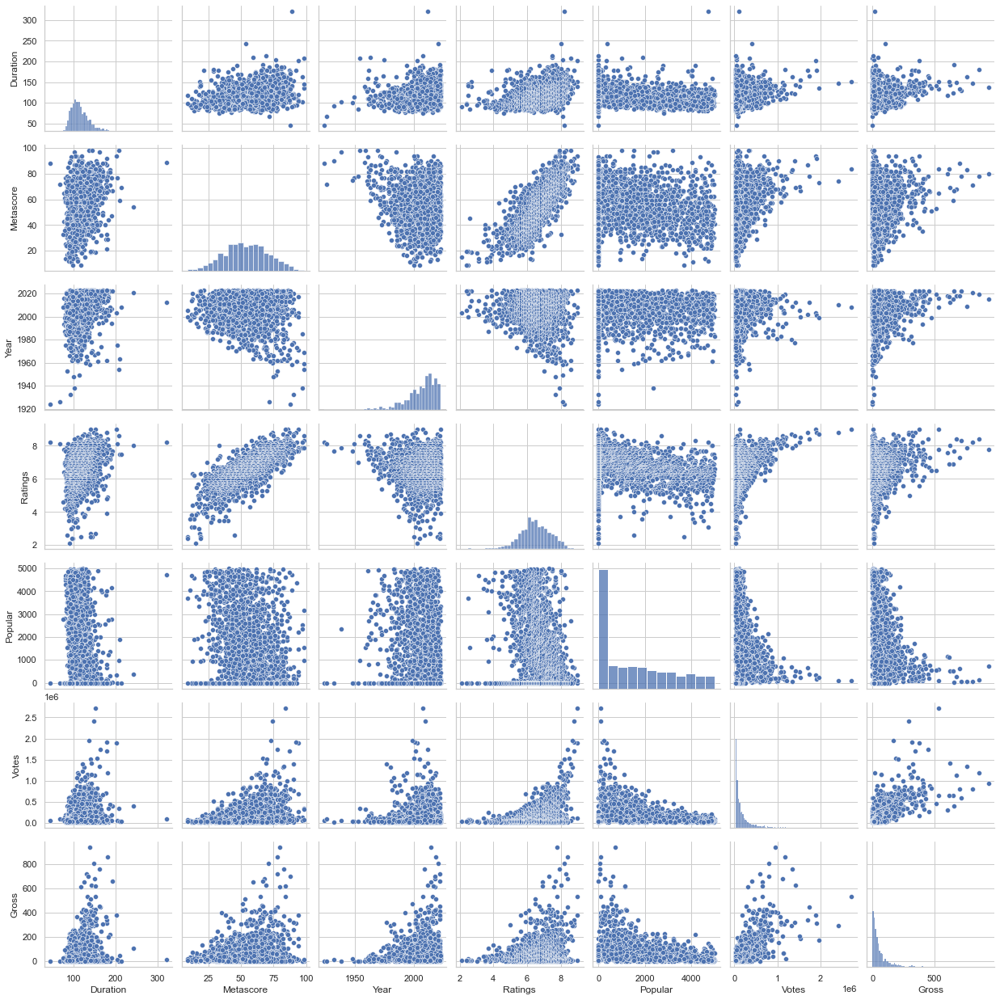

In [75]:
sns.pairplot(df)
plt.show()

##### We will have two Dataframes one for predicting Votes and one for Gross.

In [76]:
# Create new feature to show movies year released from 2023
df['Year_from_2023']=  2023 - df['Year'] 
df_gross['Year_from_2023']= 2023 - df_gross['Year'] 

In [77]:
# Drop year feature not needed anymore.
df.drop('Year', axis=1,inplace=True)
df_gross.drop('Year', axis=1,inplace=True)

In [78]:
df.columns

Index(['Name', 'Director_1', 'Director_2', 'Director_3', 'Duration',
       'Metascore', 'Ratings', 'Popular', 'Stars_1', 'Stars_2', 'Stars_3',
       'Stars_4', 'Votes', 'Genre_1', 'Genre_2', 'Genre_3', 'Gross',
       'Certification', 'Year_from_2023'],
      dtype='object')

In [79]:
import numpy as np
import pandas as pd
import scipy.stats
from scipy.stats import zscore,boxcox
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

###### Outliers

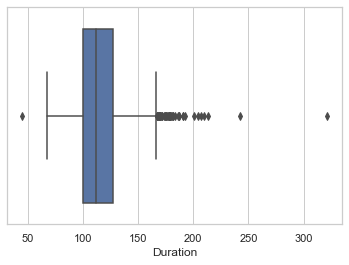

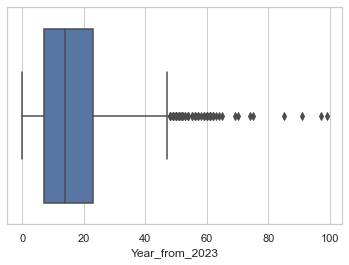

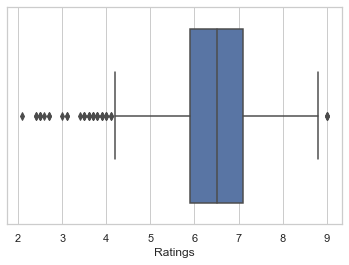

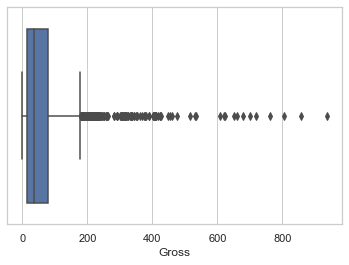

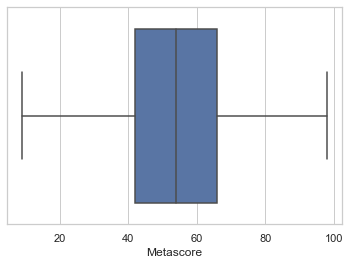

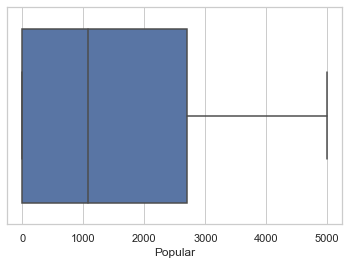

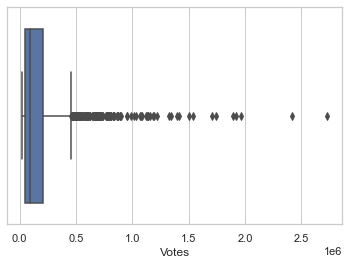

In [80]:
# Check outliers using boxplot
for col in ['Duration', 'Year_from_2023', 'Ratings','Gross','Metascore', 'Popular','Votes']:
    sns.boxplot(df[col])
    plt.show()

In [81]:
# use Z-score method
outliers=df[['Duration', 'Year_from_2023', 'Ratings','Gross','Metascore', 'Popular','Votes']]
z=np.abs(zscore(outliers))
df_new=df[(z<3).all(axis=1)]
df_new

,Name,Director_1,Director_2,Director_3,Duration,Metascore,Ratings,Popular,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross,Certification,Year_from_2023
0,Spider-Man: Across the Spider-Verse,Joaquim Dos San,Kemp Powers,Justin K. Thompson,140,86.0,9.0,1,hameik Moore,Hailee Steinfeld,Brian Tyree Henry,Luna Lauren Velez,125082,Animation,Action,Adventure,8.718,U,0
8,Soorarai Pottru,Sudha Kongara,NA,NA,153,90.0,8.7,0,uriy,Aparna Balamurali,Paresh Rawal,Urvashi,119651,Action,Drama,NA,9.502,U,3
13,Sita Ramam,Hanu Raghavapud,NA,NA,163,85.0,8.6,0,Dulquer Salmaan,Mrunal Thakur,Rashmika Mandanna,Sumanth,60456,Action,Drama,Mystery,11.902,U,1
16,Spider-Man: Into the Spider-Verse,Bob Persich,Peter Ramsey,Rodney Rothman,117,87.0,8.4,5,hameik Moore,Jake Johnson,Hailee Steinfeld,Mahershala Ali,588262,Animation,Action,Adventure,190.240,U,5
20,Oldeuboi,Park Chan-wook,NA,NA,101,77.0,8.4,317,Choi Min-sik,Yoo Ji-tae,Kang Hye-jeong,Kim Byeong-Ok,597835,Action,Drama,Mystery,0.710,A,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1729,The Adventures of Sharkboy and Lavagirl 3-D,Robert Rodriguez,NA,NA,93,38.0,3.7,3099,Cayden Boyd,George Lopez,Kristin Davis,David Arquette,40093,Action,Adventure,Comedy,39.180,U,18
1730,Superman IV: The Quest for Peace,Sidney J. Fu,NA,NA,90,24.0,3.7,4397,Christopher Reeve,Gene Hackman,Margot Kidder,Jackie Cooper,50804,Action,Adventure,Sci-Fi,15.680,U,36
1731,Dungeons & Dragons,Courtney Solomon,NA,NA,107,14.0,3.6,1880,Justin Whalin,Jeremy Irons,Zoe McLellan,Bruce Payne,35238,Action,Adventure,Fantasy,15.220,UA,23
1732,Mortal Kombat: Annihilation,John R. Leon,NA,NA,95,11.0,3.6,4041,Robin Shou,Talisa Soto,James Remar,Sandra Hess,56542,Action,Adventure,Fantasy,35.930,UA,26


In [82]:
# data loss percentage

loss_percentage= ((df.shape[0]- df_new.shape[0])/df.shape[0])*100
loss_percentage

6.4

###### Accepted

In [83]:
# Check Skewness
df_new.skew()

Duration          0.850293
Metascore         0.054951
Ratings          -0.249319
Popular           0.607679
Votes             1.998533
Gross             1.949444
Year_from_2023    0.960802
dtype: float64

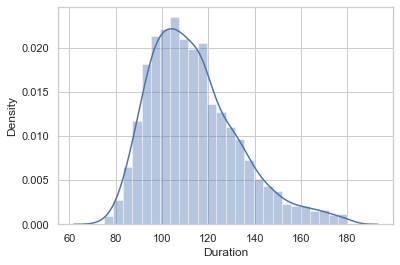

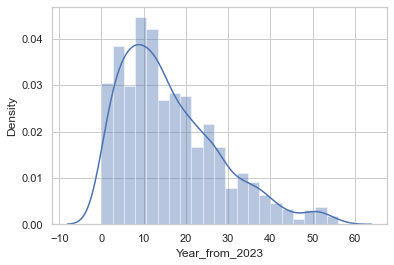

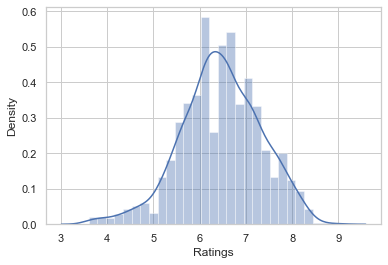

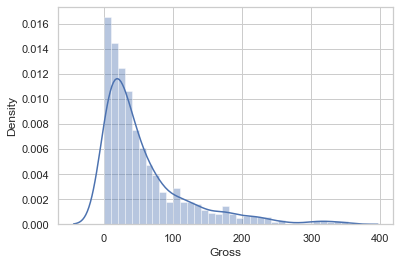

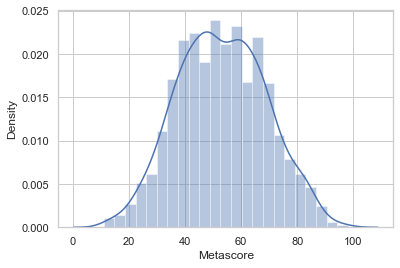

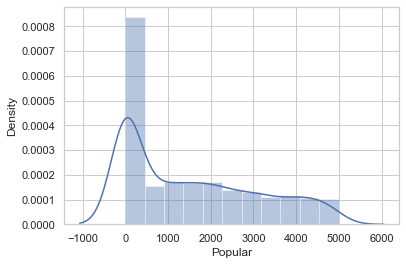

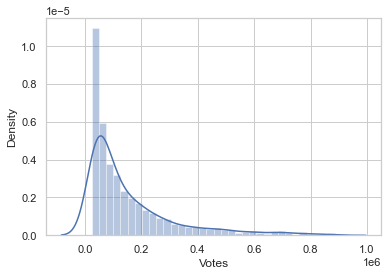

In [84]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross','Metascore', 'Popular','Votes']:
    sns.distplot(df_new[i])
    plt.show()


In [85]:
# Sort columns by datatypes
df_new.columns.to_series().groupby(df_new.dtypes).groups

{int64: ['Duration', 'Popular', 'Votes', 'Year_from_2023'], float64: ['Metascore', 'Ratings', 'Gross'], object: ['Name', 'Director_1', 'Director_2', 'Director_3', 'Stars_1', 'Stars_2', 'Stars_3', 'Stars_4', 'Genre_1', 'Genre_2', 'Genre_3', 'Certification']}

In [86]:
# I'll consider -0.3/0.3 is ok among features skewness and treat the others features.
# suchas: Gangs of Wasseypur movie both parts originally shot as a single film measuring a total=321 minutes & screened @ 2012
# URL: https://en.wikipedia.org/wiki/Gangs_of_Wasseypur

skew_cols=['Votes','Gross','Duration','Year_from_2023']

In [87]:
# withing Power transformer to treat skewness
scaler = PowerTransformer()
df_new[skew_cols] = scaler.fit_transform(df_new[skew_cols].values)

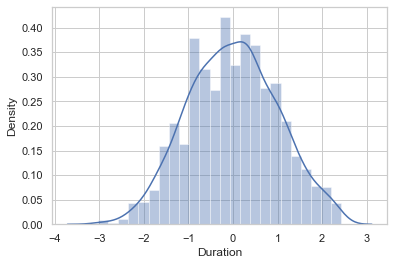

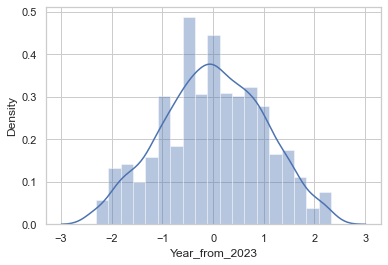

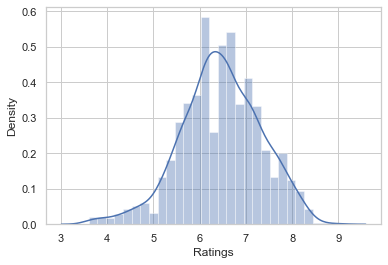

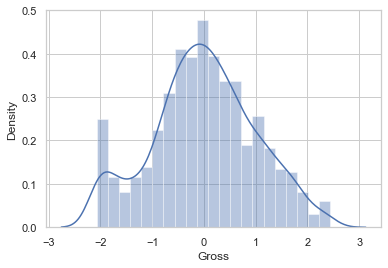

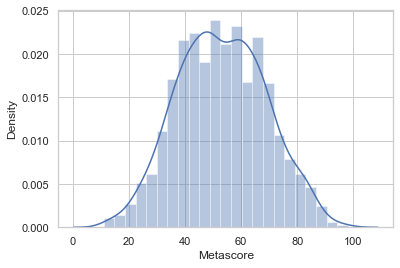

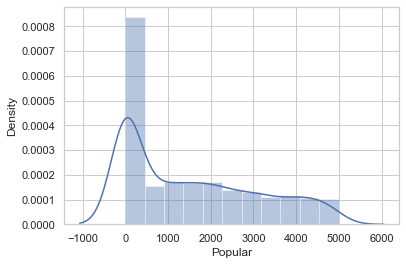

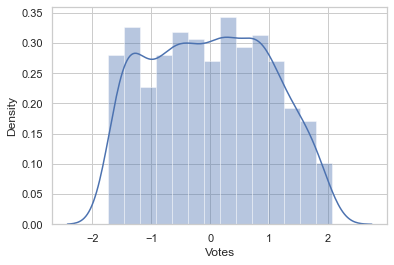

In [88]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross','Metascore', 'Popular','Votes']:
    sns.distplot(df_new[i])
    plt.show()

In [89]:
# Check Skewness
df_new.skew()

Duration          0.022182
Metascore         0.054951
Ratings          -0.249319
Popular           0.607679
Votes             0.067681
Gross            -0.039845
Year_from_2023   -0.052080
dtype: float64

In [90]:
# drop unnecessary columns
df_new.drop(columns=['Name'],axis=1,inplace=True)

###### Encoding

In [91]:
# Use getdummies and frequency for large  for nominal features 
    
df_new=pd.get_dummies(df_new,columns=['Genre_1','Genre_2','Genre_3','Certification'],drop_first=True)

In [92]:
# Calculate the frequency of each category

for i in ['Director_1','Stars_1', 'Stars_2','Stars_3', 'Stars_4','Director_2','Director_3']:
    frequency = df_new[i].value_counts(normalize=True)
    # Create a new column with the frequency encoding
    df_new[i] = df_new[i].map(frequency)

# Display the DataFrame with the frequency encoded columns
df_new

,Director_1,Director_2,Director_3,Duration,Metascore,Ratings,Popular,Stars_1,Stars_2,Stars_3,...,Certification_PG,Certification_PG-13,Certification_R,Certification_U,Certification_U/A,Certification_U/A 16+,Certification_UA,Certification_UA 13+,Certification_UA 16+,Certification_UA 7+
0,0.000611,0.000611,0.000611,1.319481,86.0,9.0,1,0.001221,0.001221,0.000611,...,0,0,0,1,0,0,0,0,0,0
8,0.000611,0.940781,0.995726,1.745139,90.0,8.7,0,0.000611,0.000611,0.003053,...,0,0,0,1,0,0,0,0,0,0
13,0.000611,0.940781,0.995726,2.026140,85.0,8.6,0,0.000611,0.001221,0.001221,...,0,0,0,1,0,0,0,0,0,0
16,0.000611,0.000611,0.000611,0.333478,87.0,8.4,5,0.001221,0.000611,0.001221,...,0,0,0,1,0,0,0,0,0,0
20,0.001221,0.940781,0.995726,-0.618334,77.0,8.4,317,0.000611,0.000611,0.000611,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1729,0.006716,0.940781,0.995726,-1.217347,38.0,3.7,3099,0.000611,0.000611,0.000611,...,0,0,0,1,0,0,0,0,0,0
1730,0.000611,0.940781,0.995726,-1.469468,24.0,3.7,4397,0.001832,0.003053,0.001832,...,0,0,0,1,0,0,0,0,0,0
1731,0.000611,0.940781,0.995726,-0.227959,14.0,3.6,1880,0.000611,0.001832,0.000611,...,0,0,0,0,0,0,1,0,0,0
1732,0.000611,0.940781,0.995726,-1.058121,11.0,3.6,4041,0.000611,0.000611,0.001221,...,0,0,0,0,0,0,1,0,0,0


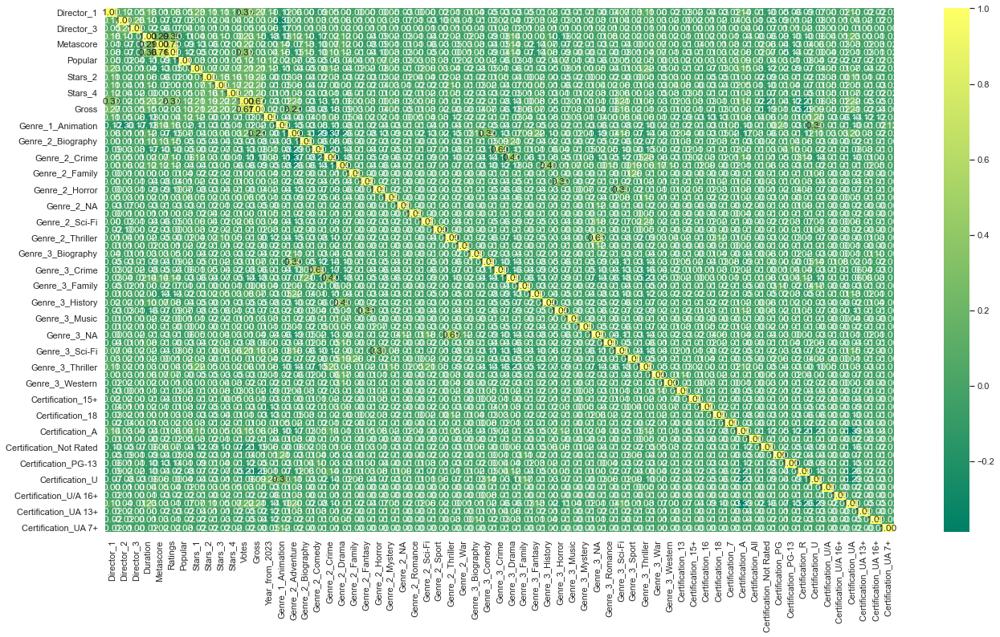

In [93]:
# heatmap correlation
plt.figure(figsize = (22,12))
sns.heatmap(df_new.corr(), annot=True,cmap='summer',fmt='.2f')
plt.show()

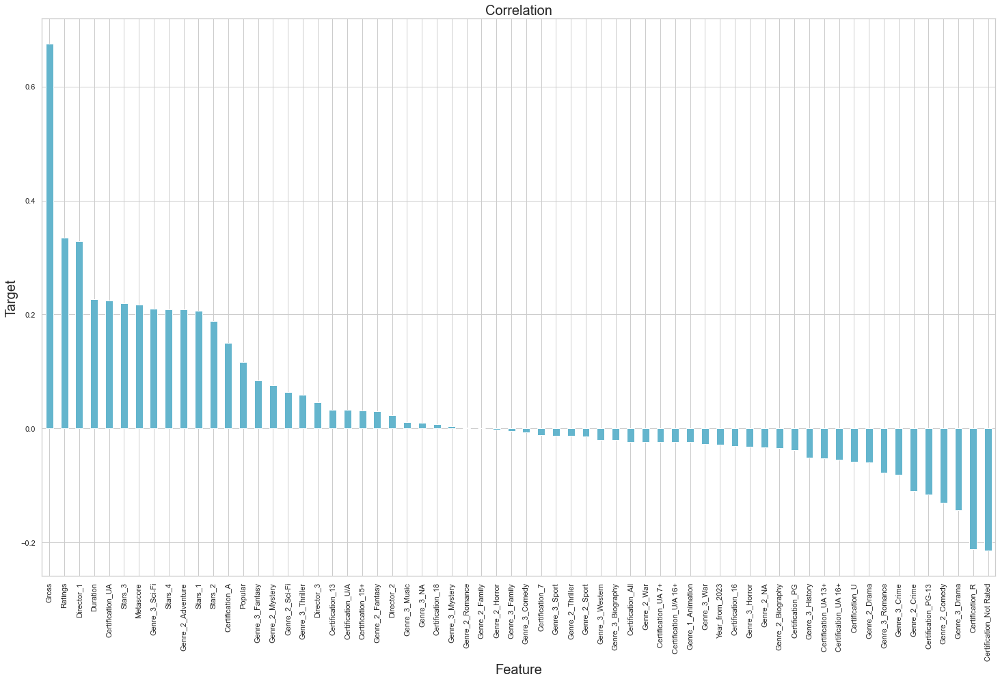

In [94]:
#Visualization of the Correlation Metrics for using Votes as target feature
plt.figure(figsize = (25, 15))

df_new.corr()['Votes'].sort_values(ascending = False).drop(['Votes']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('Target', fontsize = 20)

plt.title('Correlation', fontsize = 20)

plt.show()


###### Gross_Millions is strong postive correlation withe the target.

Mystery,Thirler , Romance and Family in Genre_2 is almost zero correlation.

Popularity is strong negative correlation with the target.

###### Gross_DataFrame

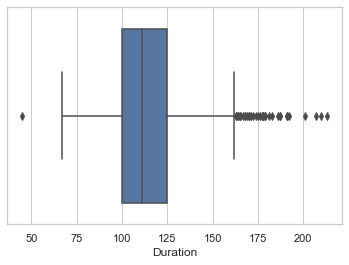

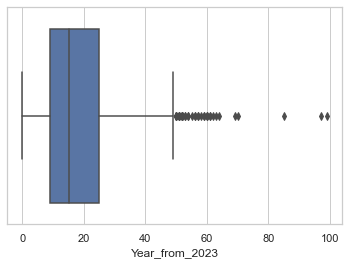

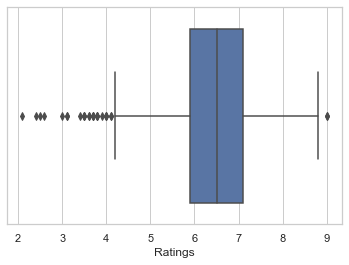

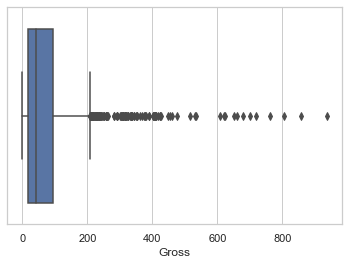

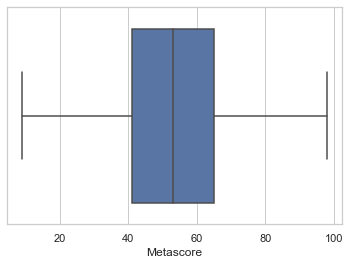

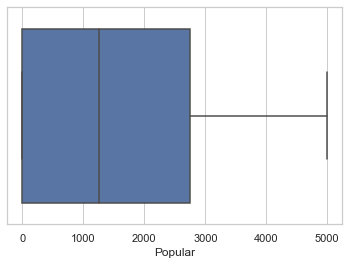

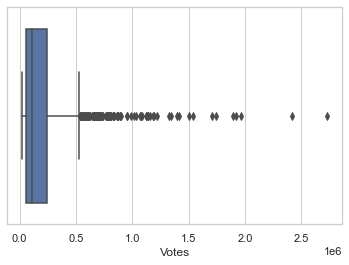

In [95]:
# Check outliers using boxplot
for col in ['Duration', 'Year_from_2023', 'Ratings','Gross','Metascore', 'Popular','Votes']:
    sns.boxplot(df_gross[col])
    plt.show()

In [96]:
# use Z-score method
outliers=df_gross[['Duration', 'Year_from_2023', 'Ratings','Gross','Metascore', 'Popular','Votes']]
z=np.abs(zscore(outliers))
dfgross_new=df_gross[(z<3).all(axis=1)]
dfgross_new

,Name,Director_1,Director_2,Director_3,Duration,Metascore,Ratings,Popular,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross,Certification,Year_from_2023
16,Spider-Man: Into the Spider-Verse,Bob Persich,Peter Ramsey,Rodney Rothman,117,87.0,8.4,5,hameik Moore,Jake Johnson,Hailee Steinfeld,Mahershala Ali,588262,Animation,Action,Adventure,190.24,U,5
20,Oldeuboi,Park Chan-wook,NA,NA,101,77.0,8.4,317,Choi Min-sik,Yoo Ji-tae,Kang Hye-jeong,Kim Byeong-Ok,597835,Action,Drama,Mystery,0.71,A,20
22,Aliens,James Cameron,NA,NA,137,84.0,8.4,419,igourney Weave,Michael Biehn,Carrie Henn,Paul Reiser,733830,Action,Adventure,Sci-Fi,85.16,U,37
26,Heat,Michael Mann,NA,NA,170,76.0,8.3,92,Al Pacino,Robert De Niro,Val Kilmer,Jon Voight,678711,Action,Crime,Drama,67.44,A,28
28,Mononoke-hime,Hayao Miyazak,NA,NA,134,76.0,8.3,1232,Yôji Matsud,Yuriko Ishida,Yûko Tanaka,Billy Crudup,407836,Animation,Action,Adventure,2.38,U,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1726,The Avengers,Jeremiah S. Chechik,NA,NA,89,12.0,3.8,0,Ralph Fienne,Uma Thurman,Sean Connery,Patrick Macnee,44624,Action,Adventure,Sci-Fi,23.32,PG-13,25
1727,The Adventures of Pluto Nash,Ron Underwood,NA,NA,95,12.0,3.8,0,Eddie Murphy,Jay Mohr,Randy Quaid,Rosario Dawson,26487,Action,Comedy,Sci-Fi,4.42,PG-13,21
1728,Batman & Robin,Joel Schumach,NA,NA,125,28.0,3.7,933,Arnold Schwarzenegge,George Clooney,Chris O'Donnell,Uma Thurman,260175,Action,Sci-Fi,NA,107.33,U,26
1729,The Adventures of Sharkboy and Lavagirl 3-D,Robert Rodriguez,NA,NA,93,38.0,3.7,3099,Cayden Boyd,George Lopez,Kristin Davis,David Arquette,40093,Action,Adventure,Comedy,39.18,U,18


In [97]:
# data loss percentage

loss_percentage= ((df_gross.shape[0]- dfgross_new.shape[0])/df_gross.shape[0])*100
loss_percentage

6.7934782608695645

###### Accepted

In [98]:
# Check Skewness
dfgross_new.skew()

Duration          0.692255
Metascore         0.087130
Ratings          -0.278240
Popular           0.547752
Votes             1.818035
Gross             1.803039
Year_from_2023    0.884863
dtype: float64

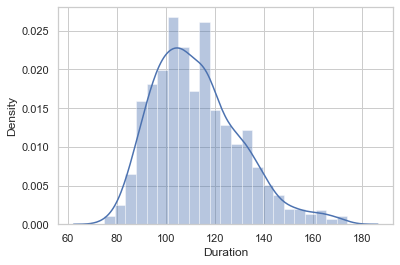

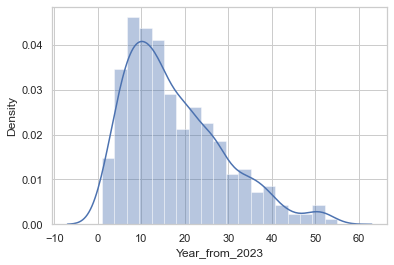

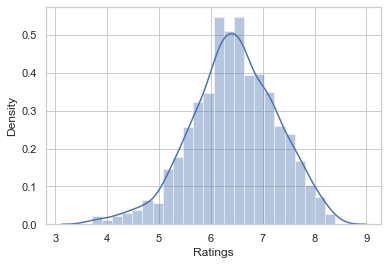

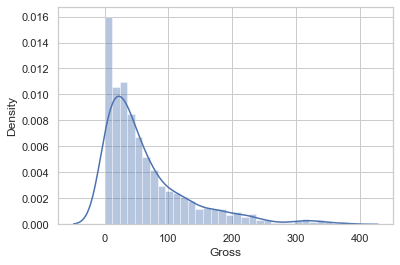

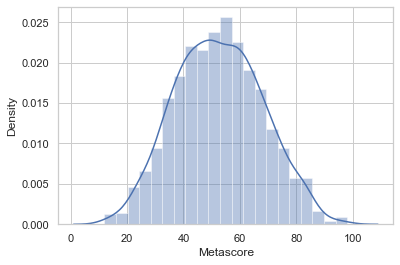

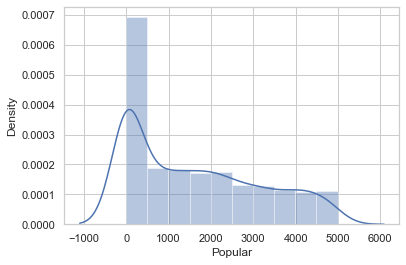

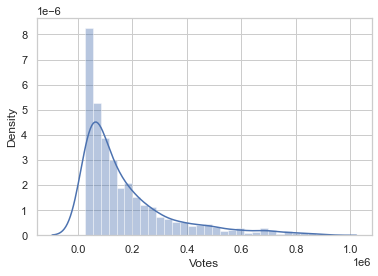

In [99]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross','Metascore', 'Popular','Votes']:
    sns.distplot(dfgross_new[i])
    plt.show()

In [100]:
# I'll consider -0.7/0.7 is ok among features skewness and treat the others features.
skew_cols=['Votes','Gross','Duration','Year_from_2023']

In [101]:
# withing Power transformer to treat skewness
scaler = PowerTransformer()
dfgross_new[skew_cols] = scaler.fit_transform(dfgross_new[skew_cols].values)

In [102]:
# drop unnecessary columns
dfgross_new.drop(columns=['Name'],axis=1,inplace=True)

###### Encoding

In [103]:
# Use getdummies for nominal features 
    
dfgross_new=pd.get_dummies(dfgross_new,columns=['Genre_1','Genre_2','Genre_3','Certification'],drop_first=True)

In [104]:
# Calculate the frequency of each category

for i in ['Director_1','Stars_1', 'Year_from_2023','Stars_2','Stars_3','Stars_4','Director_2','Director_3']:
    frequency = dfgross_new[i].value_counts(normalize=True)
    # Create a new column with the frequency encoding
    dfgross_new[i] = dfgross_new[i].map(frequency)

# Display the DataFrame with the frequency encoded columns
dfgross_new

,Director_1,Director_2,Director_3,Duration,Metascore,Ratings,Popular,Stars_1,Stars_2,Stars_3,...,Certification_A,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R,Certification_U,Certification_U/A,Certification_UA,Certification_UA 13+,Certification_UA 16+
16,0.000729,0.000729,0.000729,0.382776,87.0,8.4,5,0.000729,0.000729,0.001458,...,0,0,0,0,0,1,0,0,0,0
20,0.000729,0.943149,0.996356,-0.601560,77.0,8.4,317,0.000729,0.000729,0.000729,...,1,0,0,0,0,0,0,0,0,0
22,0.002187,0.943149,0.996356,1.326679,84.0,8.4,419,0.002187,0.000729,0.000729,...,0,0,0,0,0,1,0,0,0,0
26,0.005102,0.943149,0.996356,2.451244,76.0,8.3,92,0.001458,0.000729,0.001458,...,1,0,0,0,0,0,0,0,0,0
28,0.000729,0.943149,0.996356,1.200798,76.0,8.3,1232,0.000729,0.000729,0.000729,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1726,0.000729,0.943149,0.996356,-1.537805,12.0,3.8,0,0.001458,0.000729,0.000729,...,0,0,0,1,0,0,0,0,0,0
1727,0.001458,0.943149,0.996356,-1.044025,12.0,3.8,0,0.006560,0.000729,0.001458,...,0,0,0,1,0,0,0,0,0,0
1728,0.002915,0.943149,0.996356,0.791834,28.0,3.7,933,0.016035,0.001458,0.001458,...,0,0,0,0,0,1,0,0,0,0
1729,0.007289,0.943149,0.996356,-1.202472,38.0,3.7,3099,0.000729,0.000729,0.000729,...,0,0,0,0,0,1,0,0,0,0


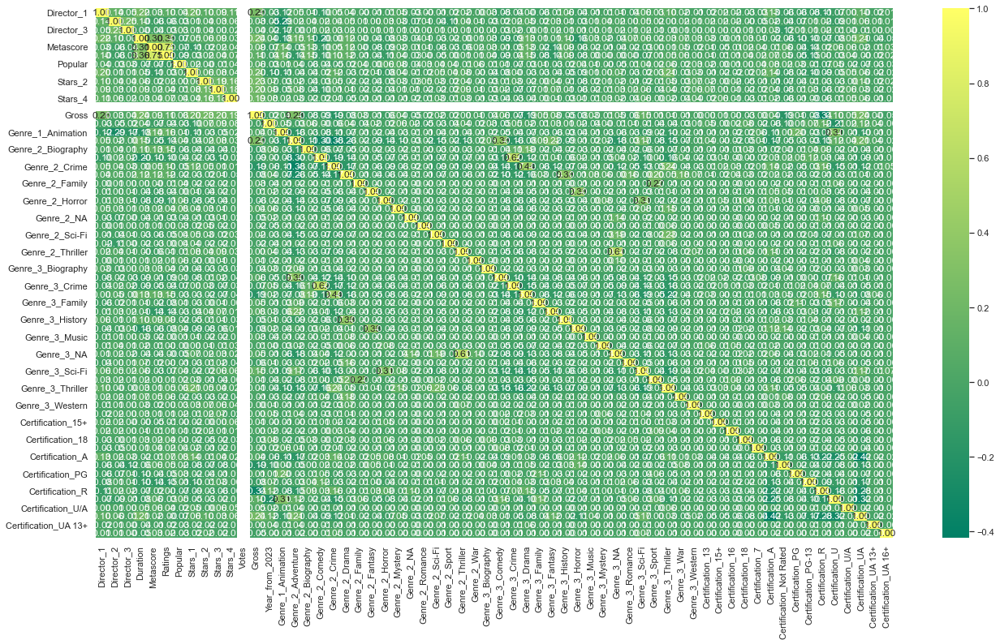

In [105]:
# heatmap correlation
plt.figure(figsize = (22,12))
sns.heatmap(dfgross_new.corr(), annot=True,cmap='summer',fmt='.2f')
plt.show()

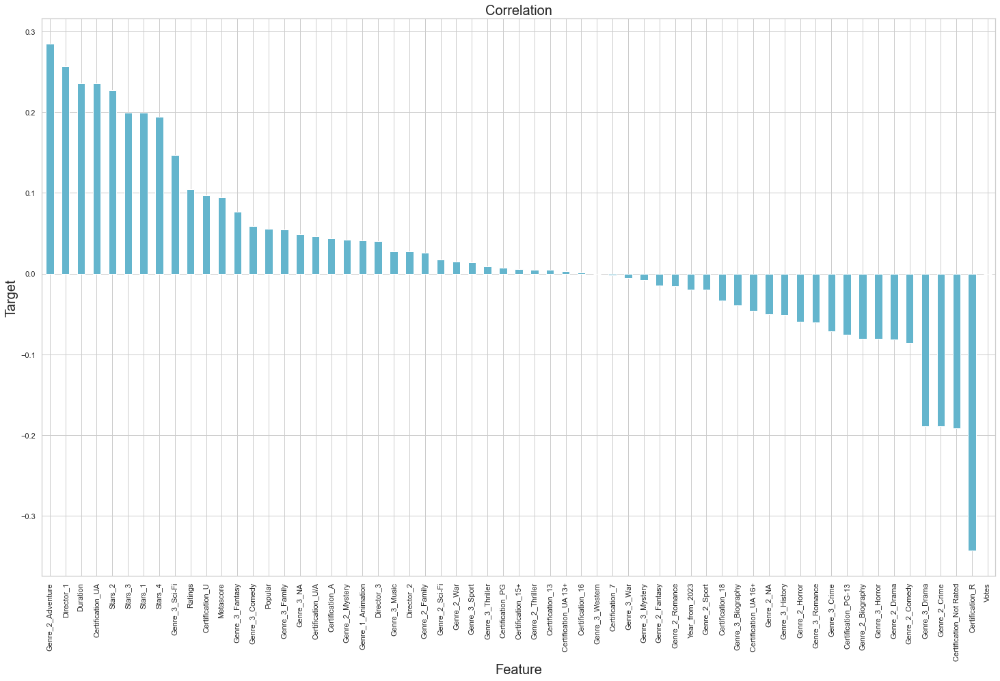

In [106]:
#Visualization of the Correlation Metrics for using Votes as target feature
plt.figure(figsize = (25, 15))

dfgross_new.corr()['Gross'].sort_values(ascending = False).drop(['Gross']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('Target', fontsize = 20)

plt.title('Correlation', fontsize = 20)

plt.show()

###### Votes is strong postive correlation withe the target.

war , sport Thriller in Genre_3 Genre_2_Thriller is the least correlation with the target.

Popularity is strong negative correlation with the target.



###### Regression Model (Votes)

In [107]:
# Votes is the target feature now.
x = df_new.drop('Votes',axis=1)
y = df_new['Votes']

Standardization

In [108]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,Director_1,Director_2,Director_3,Duration,Metascore,Ratings,Popular,Stars_1,Stars_2,Stars_3,...,Certification_PG,Certification_PG-13,Certification_R,Certification_U,Certification_U/A,Certification_U/A 16+,Certification_UA,Certification_UA 13+,Certification_UA 16+,Certification_UA 7+
0,-0.788887,-3.987501,-15.264338,1.319481,2.095019,2.945791,-0.998653,-0.699348,-0.085155,-0.610273,...,-0.092848,-0.219054,-0.377173,2.443402,-0.024716,-0.024716,-0.701287,-0.065512,-0.074329,-0.024716
1,-0.788887,0.250891,0.065512,1.745139,2.349662,2.598237,-0.999294,-0.850353,-0.691607,3.011563,...,-0.092848,-0.219054,-0.377173,2.443402,-0.024716,-0.024716,-0.701287,-0.065512,-0.074329,-0.024716
2,-0.788887,0.250891,0.065512,2.026140,2.031358,2.482386,-0.999294,-0.850353,-0.085155,0.295186,...,-0.092848,-0.219054,-0.377173,2.443402,-0.024716,-0.024716,-0.701287,-0.065512,-0.074329,-0.024716
3,-0.788887,-3.987501,-15.264338,0.333478,2.158680,2.250683,-0.996092,-0.699348,-0.691607,0.295186,...,-0.092848,-0.219054,-0.377173,2.443402,-0.024716,-0.024716,-0.701287,-0.065512,-0.074329,-0.024716
4,-0.466322,0.250891,0.065512,-0.618334,1.522073,2.250683,-0.796317,-0.850353,-0.691607,-0.610273,...,-0.092848,-0.219054,-0.377173,-0.409265,-0.024716,-0.024716,-0.701287,-0.065512,-0.074329,-0.024716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1633,2.436767,0.250891,0.065512,-1.217347,-0.960693,-3.194326,0.985010,-0.850353,-0.691607,-0.610273,...,-0.092848,-0.219054,-0.377173,2.443402,-0.024716,-0.024716,-0.701287,-0.065512,-0.074329,-0.024716
1634,-0.788887,0.250891,0.065512,-1.469468,-1.851942,-3.194326,1.816125,-0.548342,1.734200,1.200645,...,-0.092848,-0.219054,-0.377173,2.443402,-0.024716,-0.024716,-0.701287,-0.065512,-0.074329,-0.024716
1635,-0.788887,0.250891,0.065512,-0.227959,-2.488549,-3.310178,0.204479,-0.850353,0.521297,-0.610273,...,-0.092848,-0.219054,-0.377173,-0.409265,-0.024716,-0.024716,1.425950,-0.065512,-0.074329,-0.024716
1636,-0.788887,0.250891,0.065512,-1.058121,-2.679531,-3.310178,1.588177,-0.850353,-0.691607,0.295186,...,-0.092848,-0.219054,-0.377173,-0.409265,-0.024716,-0.024716,1.425950,-0.065512,-0.074329,-0.024716


###### Feature reduction

###### F-Regression

In [109]:
from sklearn.feature_selection import f_regression
F_values, p_values  = f_regression(x, y )

In [110]:
import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(x.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

In [111]:
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value']).head(25)

In [112]:
f_reg_results

,Variable,F_Value,P_Value
0,Director_1,198.794232,0.000
41,Genre_3_Sci-Fi,75.509530,0.000
17,Genre_2_Crime,19.778369,0.000
16,Genre_2_Comedy,28.170903,0.000
51,Certification_A,37.986916,0.000
14,Genre_2_Adventure,74.450811,0.000
53,Certification_Not Rated,78.193277,0.000
55,Certification_PG-13,22.017025,0.000
11,Gross,1364.743946,0.000
10,Stars_4,74.765945,0.000


In [113]:
l1_fr=f_reg_results['Variable'][:-1].values  # CI=0.90
l1_fr

array(['Director_1', 'Genre_3_Sci-Fi', 'Genre_2_Crime', 'Genre_2_Comedy',
       'Certification_A', 'Genre_2_Adventure', 'Certification_Not Rated',
       'Certification_PG-13', 'Gross', 'Stars_4', 'Stars_2', 'Stars_1',
       'Popular', 'Ratings', 'Metascore', 'Duration', 'Certification_R',
       'Certification_UA', 'Stars_3', 'Genre_3_Drama', 'Genre_3_Fantasy',
       'Genre_3_Crime', 'Genre_2_Mystery', 'Genre_3_Romance'],
      dtype=object)

In [114]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet,SGDRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
ls=Lasso()
rd=Ridge()
en=ElasticNet()
sgd=SGDRegressor()
rf=RandomForestRegressor()
ad=AdaBoostRegressor()
grd=GradientBoostingRegressor()

###### Randomn Forest Regression

In [115]:
rf = RFE(RandomForestRegressor(), n_features_to_select=17).fit(x,y)

In [116]:
l2_rf = x.columns[rf.get_support()]

In [117]:
l2_rf

Index(['Director_1', 'Duration', 'Metascore', 'Ratings', 'Popular', 'Stars_1',
       'Stars_2', 'Stars_3', 'Stars_4', 'Gross', 'Year_from_2023',
       'Genre_2_Adventure', 'Genre_2_Crime', 'Genre_3_Thriller',
       'Certification_A', 'Certification_U', 'Certification_UA'],
      dtype='object')

In [118]:
SKB = SelectKBest(f_classif, k=17).fit(x, y )

In [119]:
l3_skb = x.columns[SKB.get_support()]

In [120]:
l3_skb

Index(['Genre_3_Thriller', 'Genre_3_War', 'Genre_3_Western',
       'Certification_13', 'Certification_15+', 'Certification_16',
       'Certification_18', 'Certification_7', 'Certification_A',
       'Certification_All', 'Certification_PG', 'Certification_PG-13',
       'Certification_U/A', 'Certification_U/A 16+', 'Certification_UA 13+',
       'Certification_UA 16+', 'Certification_UA 7+'],
      dtype='object')

In [121]:
list(set(list(l1_fr)+list(l2_rf)+list(l3_skb)))

['Genre_2_Mystery',
 'Certification_U',
 'Gross',
 'Genre_2_Crime',
 'Duration',
 'Genre_3_Western',
 'Certification_U/A 16+',
 'Certification_UA',
 'Certification_A',
 'Genre_3_Thriller',
 'Certification_UA 7+',
 'Genre_3_Sci-Fi',
 'Stars_2',
 'Certification_U/A',
 'Certification_R',
 'Genre_3_Crime',
 'Certification_15+',
 'Certification_UA 16+',
 'Certification_PG-13',
 'Certification_7',
 'Genre_2_Comedy',
 'Genre_2_Adventure',
 'Genre_3_Romance',
 'Metascore',
 'Certification_All',
 'Popular',
 'Year_from_2023',
 'Stars_1',
 'Genre_3_Fantasy',
 'Genre_3_War',
 'Certification_UA 13+',
 'Certification_13',
 'Director_1',
 'Stars_4',
 'Certification_Not Rated',
 'Stars_3',
 'Genre_3_Drama',
 'Certification_16',
 'Certification_PG',
 'Certification_18',
 'Ratings']

In [122]:
final_list= ['Certification_18',
 'Certification_16',
 'Genre_3_Crime',
 'Genre_3_War',
 'Certification_PG-13',
 'Genre_2_Adventure',
 'Certification_U/A 16+',
 'Metascore',
 'Certification_Not Rated',
 'Stars_3',
 'Duration',
 'Certification_R',
 'Stars_2',
 'Certification_13',
 'Certification_U/A',
 'Certification_All',
 'Certification_UA 7+',
 'Genre_3_Romance',
 'Certification_UA 13+',
 'Ratings',
 'Genre_3_Sci-Fi',
 'Genre_3_Drama',
 'Genre_2_Crime',
 'Genre_3_Western',
 'Genre_3_Thriller',
 'Certification_UA',
 'Stars_1',
 'Popular',
 'Genre_2_Mystery',
 'Gross',
 'Certification_A',
 'Certification_15+',
 'Genre_3_Fantasy',
 'Stars_4',
 'Genre_2_Comedy',
 'Certification_7',
 'Year_from_2023',
 'Certification_PG',
 'Certification_UA 16+',
 'Certification_U',
 'Director_1']

###### VIF check Multicollinarity

In [123]:
x = x[final_list]
y = y

In [124]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [125]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
25,122.855556,Certification_UA
30,99.804947,Certification_A
39,69.123505,Certification_U
11,61.119503,Certification_R
8,26.424314,Certification_Not Rated
4,25.038528,Certification_PG-13
0,12.532507,Certification_18
1,9.616792,Certification_16
37,5.687016,Certification_PG
13,5.666042,Certification_13


###### ML Alog

In [126]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    lr= LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7042141547573497 seen for random state: 27


###### Split

In [127]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=max_RS)

In [128]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_train=r2_score(y_train,pred_train)
score_test=r2_score(y_test,pred_test)
mse = mean_squared_error(y_test, pred_test)

print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test))

R2_Score_train:  0.6448598624633096
R2_Score_test:  0.7042141547573497
RMSE =  0.5538
The mean absolute error =  0.42806713464482676


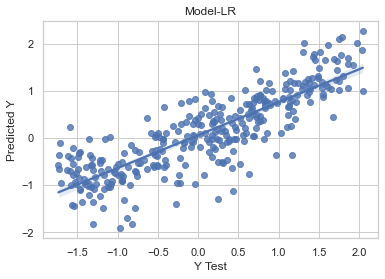

In [129]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-LR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

Cross Validation

In [130]:
for i in range(2,11):
    cv_score=cross_val_score(lr,x,y,scoring='r2',cv=i)
    cv_mean= cv_score.mean()
    cv_std= cv_score.std()
    print(f'At Cross fold {i} the cv score mean is {cv_mean*100} and the cv score std is {cv_std},testing accuracy score= {score_test*100}')
    print('\n')

At Cross fold 2 the cv score mean is -9.9627001067774e+26 and the cv score std is 9.9627001067774e+24,testing accuracy score= 70.42141547573497


At Cross fold 3 the cv score mean is -6.575426372418278e+27 and the cv score std is 7.610648513680736e+25,testing accuracy score= 70.42141547573497


At Cross fold 4 the cv score mean is -1.1079546957220466e+28 and the cv score std is 1.896763075145184e+26,testing accuracy score= 70.42141547573497


At Cross fold 5 the cv score mean is 47.04132367945591 and the cv score std is 0.13139644841542192,testing accuracy score= 70.42141547573497


At Cross fold 6 the cv score mean is -9.76003176868738e+27 and the cv score std is 2.1571293915775557e+26,testing accuracy score= 70.42141547573497


At Cross fold 7 the cv score mean is -5.91011923354289e+27 and the cv score std is 1.341344516479219e+26,testing accuracy score= 70.42141547573497


At Cross fold 8 the cv score mean is -1.4321188694300592e+26 and the cv score std is 2.5976913066243617e+24,tes

In [131]:
# Define the degree of polynomial features
degree = 2

# Create an instance of PolynomialFeatures
poly_features = PolynomialFeatures(degree=degree)

# Fit and transform the training features to polynomial features
X_train_poly = poly_features.fit_transform(x_train)

# Transform the testing features to polynomial features
X_test_poly = poly_features.transform(x_test)

###### Ridge

In [132]:
# Create an instance of Ridge regression
ridge_model = Ridge()

ridge_model.fit(X_train_poly, y_train)

pred_train_ridge=ridge_model.predict(X_train_poly)
pred_test_ridge = ridge_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_ridge)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_ridge))

R2_Score_train:  0.8382617803410561
R2_Score_test:  0.6062961552032007
RMSE =  0.639
The mean absolute error =  0.4530839076012362


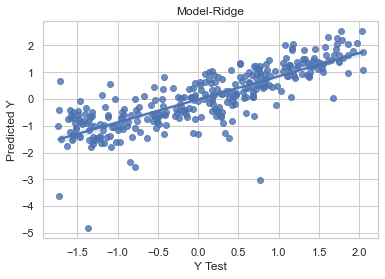

In [133]:
sns.regplot(x=y_test,y=pred_test_ridge)
plt.title("Model-Ridge")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [134]:
# Create an instance of Lasso regression
lasso_model = Lasso()


lasso_model.fit(X_train_poly, y_train)

pred_train_lasso=lasso_model.predict(X_train_poly)
pred_test_lasso = lasso_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_lasso)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_lasso))

R2_Score_train:  0.8382617803410561
R2_Score_test:  0.6062961552032007
RMSE =  1.0243
The mean absolute error =  0.8747825425993493


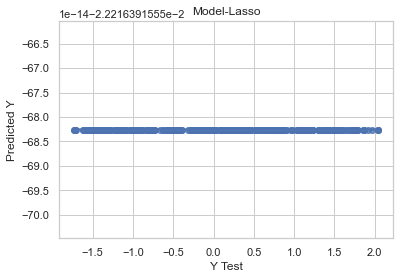

In [135]:
sns.regplot(x=y_test,y=pred_test_lasso)
plt.title("Model-Lasso")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### KNN

In [136]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    knn = KNeighborsRegressor()
    knn.fit(x_train,y_train)
    pred = knn.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.5627583814803305 seen for random state: 70


In [137]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=knn.predict(x_train)
pred_test = knn.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(knn, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.5967319651218239
The r2 score_test is: 0.6862030383702167
The mean absolute error 0.4576221574629602
The mean squared error 0.32029178104604594
The cross validation score 0.29514724456705116


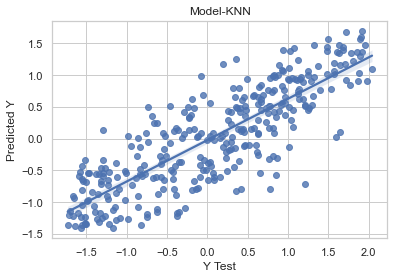

In [138]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-KNN")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### SVR

In [139]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    svr = SVR()
    svr.fit(x_train,y_train)
    pred = svr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.748328362000255 seen for random state: 2


In [140]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=svr.predict(x_train)
pred_test = svr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(svr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.7703767607685887
The r2 score_test is: 0.8507735015909624
The mean absolute error 0.2883036853102107
The mean squared error 0.15689255434872326
The cross validation score 0.5976919722468474


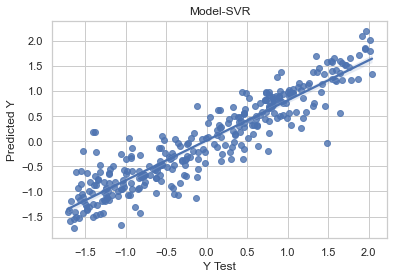

In [141]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-SVR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [142]:
from sklearn.tree import DecisionTreeRegressor 

###### DTR

In [143]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
  
    dtr = DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    pred = dtr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6296512164033837 seen for random state: 72


In [144]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=dtr.predict(x_train)
pred_test= dtr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(dtr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.9204841336270421
The r2 score_test is: 0.9157041237775816
The mean absolute error 0.09938182460459911
The mean squared error 0.08272415793609977
The cross validation score 0.42386240967473177


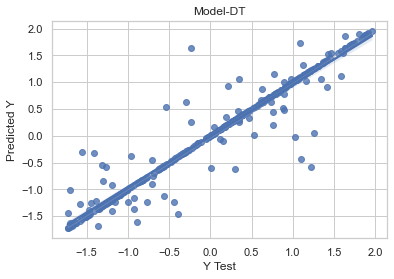

In [145]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-DT")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### RFR

In [146]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8307499470738122 seen for random state: 73


In [147]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=rfr.predict(x_train)
pred_test= rfr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(rfr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.931349843421765
The r2 score_test is: 0.9458270501594905
The mean absolute error 0.16704322994105222
The mean squared error 0.056683102248129925
The cross validation score 0.7027277543554188


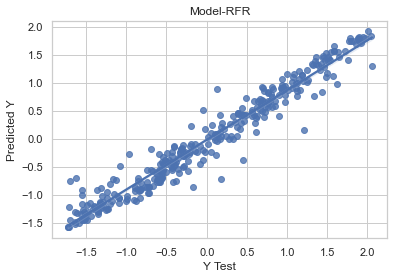

In [148]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-RFR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

GB Regressor

In [149]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    gbr=GradientBoostingRegressor()
    gbr.fit(x_train,y_train)
    pred=gbr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)


The max accuracy is 0.8407883547221986 seen for random state: 73


In [150]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=gbr.predict(x_train)
pred_test = gbr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(gbr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8605228835434372
The r2 score_test is: 0.886592704168597
The mean absolute error 0.26708555686631813
The mean squared error 0.11866212499450053
The cross validation score 0.7247500938755809


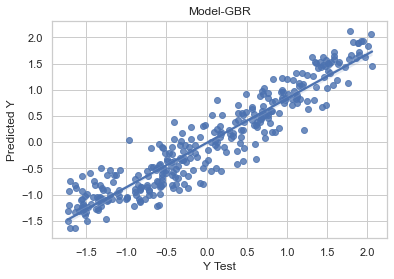

In [151]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-GBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### ADAB Regressor

In [152]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    
    adr=AdaBoostRegressor()
    adr.fit(x_train,y_train)
    adr_pred=adr.predict(x_test)
    acc = r2_score(y_test, adr_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.75067198450268 seen for random state: 85


In [153]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=adr.predict(x_train)
pred_test = adr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(adr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.720959829247255
The r2 score_test is: 0.752130405520816
The mean absolute error 0.4401442661873159
The mean squared error 0.26837117455322357
The cross validation score 0.6145763786989658


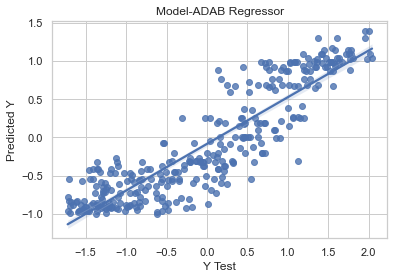

In [154]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-ADAB Regressor")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [155]:
!pip3 install xgboost

Defaulting to user installation because normal site-packages is not writeable


###### XGB Regressor

In [156]:
import xgboost

In [157]:
from xgboost import XGBRegressor

In [158]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    xgb=XGBRegressor()
    xgb.fit(x_train,y_train)
    xgb_pred=xgb.predict(x_test)
    acc = r2_score(y_test, xgb_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8263604011317794 seen for random state: 73


In [159]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=xgb.predict(x_train)
pred_test= xgb.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(xgb, x,y,cv=10)
print('The cross validation score', cv.mean(),cv.std())

The r2 score_train is: 0.9480296202296842
The r2 score_test is: 0.9667430879289212
The mean absolute error 0.08621855791296984
The mean squared error 0.03479790103606996
The cross validation score 0.6929415533573804 0.1015913834207223


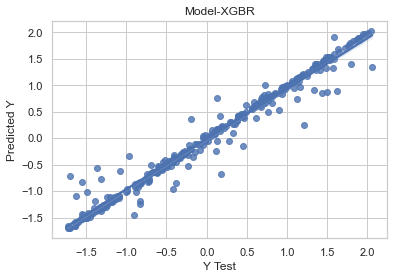

In [160]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [161]:
np.random.seed(10)

def rmse_cv(model, x, y):
    rmse = -cross_val_score(model, x, y, scoring='neg_mean_squared_error', cv=10)
    return (rmse)

models = [LinearRegression(), Ridge(), Lasso(), SVR(), KNeighborsRegressor(),
          DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor(),
          AdaBoostRegressor(), XGBRegressor()]

names = ['lr', 'ridge', 'lasso', 'svr', 'knn', 'dtr', 'rfr', 'gbr', 'adr', 'xgb']

for model, name in zip(models, names):
    score = rmse_cv(model, x, y)
    print("{}: {:.6f}, {:.6f}".format(name, score.mean(), score.std()))

lr: 53605643761764226224357376.000000, 159836235007246861101694976.000000
ridge: 0.385401, 0.101306
lasso: 1.031406, 0.306249
svr: 0.333311, 0.077711
knn: 0.580460, 0.152948
dtr: 0.453604, 0.048309
rfr: 0.244871, 0.056888
gbr: 0.226670, 0.061523
adr: 0.315672, 0.078343
xgb: 0.246299, 0.054965


Best two for cross validation are XGB and RF regressors but XGB regressor is also better in r2 score so i will go with XGBR

In [162]:
# Tunning Hyperparameters for XGB Regressor

# Define the parameter grid
params = {
    'n_estimators': [100, 200,500,700,1000],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3,5,7,9],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8,1],
    'min_child_weight': [1,5,10]
}

xgb_tuned= GridSearchCV(XGBRegressor(),params,scoring='r2',cv =10,n_jobs=-1,verbose=True)
xgb_tuned.fit(x_train,y_train)
y_pred=xgb_tuned.predict(x_test)
print('The r2 score is:', r2_score(y_test, y_pred))
print("\n The best estimator across ALL searched params:\n", xgb_tuned.best_estimator_)
print("\n The best score across ALL searched params:\n", xgb_tuned.best_score_)
print("\n The best parameters across ALL searched params:\n",xgb_tuned.best_params_)

Fitting 10 folds for each of 720 candidates, totalling 7200 fits
The r2 score is: 0.8647830138361406

 The best estimator across ALL searched params:
 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=10, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

 The best score across ALL searched params:
 0.7976567903263537

 The best parameters across ALL searched params

In [163]:
# Reinstating with tuned parameters
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=53)

xgb_model = XGBRegressor(n_estimators= 1000,max_depth=5,colsample_bytree=0.8, learning_rate=0.01,min_child_weight=5
                         ,subsample=0.8).fit(x_train,y_train)

pred_train=xgb_model.predict(x_train)
pred_test= xgb_model.predict(x_test)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_test, pred_test))
print('The mean absolute error ', mean_absolute_error(y_test, pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

The r2 score_train is:  0.9463627219649492
The r2 score_test is:  0.7899831530291928
The mean absolute error  0.367945462676015
root_mean_squared_error:  0.4721139482749162


In [164]:
cv = cross_val_score(xgb_model, x,y,cv=10)
print('The cross validation score', cv.mean())

The cross validation score 0.743914715251603


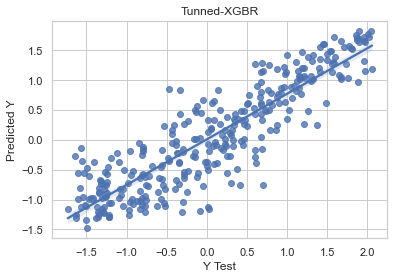

In [165]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [166]:
pip install optuna

Defaulting to user installation because normal site-packages is not writeable



In [167]:
import optuna

In [168]:
# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(x, y, test_size=0.2, random_state=53)

# Define the objective function to optimize using Optuna
def objective(trial):
    # Define the hyperparameters to tune
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'lambda': trial.suggest_float('lambda', 0.0, 1.0),
    }

    # Create the XGB regressor with the current hyperparameters
    model = XGBRegressor(**params)

    # Train the model
    model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], early_stopping_rounds=10, verbose=False)

    # Predict on the validation set
    y_pred = model.predict(X_valid)

    # Calculate the mean squared error as the objective to minimize
    mse = mean_squared_error(y_valid, y_pred)

    return mse

In [169]:
# Create an Optuna study object
study = optuna.create_study(direction='minimize')

# Optimize the objective function using Optuna
study.optimize(objective, n_trials=100)

# Get the best hyperparameters found by Optuna
best_params = study.best_params

[I 2023-06-18 20:50:46,420] A new study created in memory with name: no-name-e4791756-46e9-4ae3-a2a3-1505098a6207
[I 2023-06-18 20:50:46,736] Trial 0 finished with value: 0.2525781931343414 and parameters: {'n_estimators': 100, 'learning_rate': 0.1373220950424481, 'max_depth': 8, 'subsample': 0.7920498138386508, 'colsample_bytree': 0.7061156047853268, 'gamma': 0.1842488552693805, 'lambda': 0.34504616985783854}. Best is trial 0 with value: 0.2525781931343414.
[I 2023-06-18 20:50:47,081] Trial 1 finished with value: 0.26398664454155046 and parameters: {'n_estimators': 100, 'learning_rate': 0.02979142226065548, 'max_depth': 9, 'subsample': 0.7714501767207994, 'colsample_bytree': 0.5312077661798531, 'gamma': 0.5743227366270692, 'lambda': 0.26925730400565584}. Best is trial 0 with value: 0.2525781931343414.
[I 2023-06-18 20:50:47,301] Trial 2 finished with value: 0.2888652633415244 and parameters: {'n_estimators': 100, 'learning_rate': 0.019849705624172598, 'max_depth': 6, 'subsample': 0.62

In [170]:
import optuna.visualization as vis
# Visualize the optimization history
vis.plot_optimization_history(study).show()

# Visualize the importance of hyperparameters
vis.plot_param_importances(study).show()

# Visualize the slice of hyperparameters
vis.plot_slice(study).show()

In [171]:
# Train the final model using the best hyperparameters
final_model = XGBRegressor(**best_params)
final_model.fit(x, y)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5479761906853127, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.24089756988203595, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             lambda=0.1614575637536934, learning_rate=0.11672635049703238,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, ...)

###### In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.

In [172]:
pred_train=final_model.predict(x_train)
pred_test= final_model.predict(X_valid)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_valid, pred_test))
print('The mean absolute error ', mean_absolute_error(y_valid, pred_test))
print('mean_squared_error: ',mean_squared_error(y_valid,pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_valid,pred_test)))

The r2 score_train is:  0.909587907910241
The r2 score_test is:  0.9055302199588862
The mean absolute error  0.2464038353800691
mean_squared_error:  0.10026109264108238
root_mean_squared_error:  0.3166403206180198


In [173]:
# Calculate the cross-validation score with the final model
cv_scores = cross_val_score(final_model, x, y, cv=10)

# Optuna maximizes the objective function, so negate the mean squared error
avg_mse = cv_scores.mean()

print("Cross-validation score :", avg_mse)

Cross-validation score : 0.7335221119581246


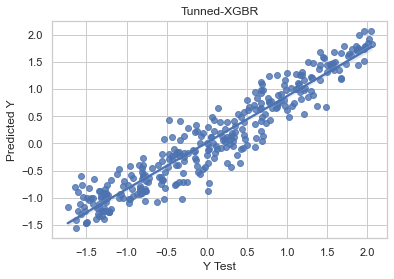

In [174]:
sns.regplot(x=y_valid,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### Conclusion
After using two different techniques of tunning the parameters of XGB regressor Algorithm. {GridSearchCV & OPTUNA}

The OPTUNA one was better than GridSearch in all the evaluation metrics also in the cross validation performance, But the orginal XGB Model before tunning is the best one in all the evaluation metrics but not in the CV as it score almost 69% Therefor i will go with the Orginal XGB regressor Model to be my Final used Model.

Evaluation Metrics & CV results:

The r2 score_train is: 0.8826213901377233 The r2 score_test is: 0.8703340950565884 The mean absolute error 0.2910317991378141 The mean squared error 0.13761485738892684 The cross validation score 0.724613425255128 0.37096476569739995 

##### Saving the Model

In [175]:
import joblib
file='global.obj'
joblib.dump(xgb,file)

['global.obj']

In [176]:
a=joblib.load('global.obj')
a

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [177]:
pred=a.predict(x_test)
pred

array([-1.33766711e+00,  5.10919392e-01,  1.84384674e-01,  7.01394856e-01,
        6.40487432e-01, -3.83190811e-01, -1.53147626e+00, -1.05332530e+00,
        7.22446740e-01,  1.62056994e+00,  5.29428609e-02, -1.51241338e+00,
        4.27106559e-01,  6.87784731e-01, -8.05858016e-01,  1.86463535e+00,
        2.64362603e-01, -1.60860643e-01, -8.32843065e-01,  1.07545340e+00,
       -7.09833264e-01, -6.01042151e-01,  1.47933686e+00,  6.84779167e-01,
        6.25197828e-01,  2.37738922e-01,  1.32250988e+00,  2.67091785e-02,
        2.01222211e-01,  1.07521307e+00, -7.77531803e-01,  4.23574954e-01,
       -7.64836311e-01, -6.86661422e-01,  6.71766400e-01, -1.24094927e+00,
       -1.33040047e+00, -1.22844732e+00, -2.75175601e-01,  7.60263264e-01,
        1.03467070e-01, -1.48313522e+00, -8.11973810e-01, -1.17075884e+00,
        7.23036602e-02, -1.36320210e+00, -1.10157990e+00, -1.03904378e+00,
        6.78226769e-01, -5.90105116e-01,  4.62683618e-01, -1.50087154e+00,
        8.80596220e-01,  

In [178]:
accuracy_score=r2_score(pred,y_test)
accuracy_score

0.9417053423706749

<AxesSubplot:ylabel='Density'>

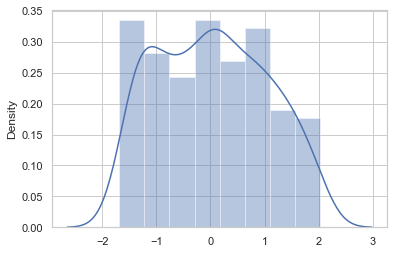

In [179]:
sns.distplot(pred)

Text(0.5, 1.0, 'Linear Regression Line')

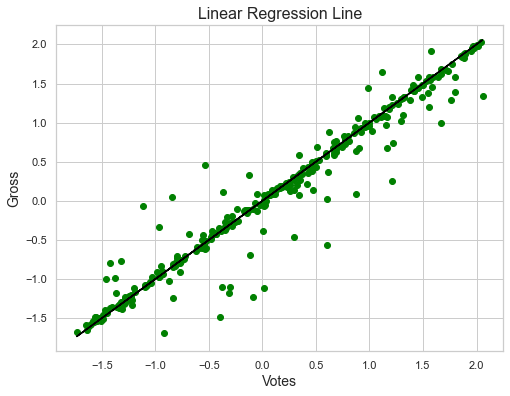

In [180]:
plt.figure(figsize=(8,6))
plt.scatter(y_test,pred,color='GREEN')
plt.plot(y_test,y_test,color='black')
plt.xlabel('Votes',fontsize=14)
plt.ylabel('Gross',fontsize=14)
plt.title('Linear Regression Line',fontsize=16)

###### As,we can see that the distance b/w the datapoints of the predicted Votes and original Votes is not that high which indicates RMSE to be on lower side.which indicates that our model is performing well

##### Conclusion

In [181]:
pd.DataFrame([a.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,...,318,319,320,321,322,323,324,325,326,327
Predicted,-1.337667,0.510919,0.184385,0.701395,0.640487,-0.383191,-1.531476,-1.053325,0.722447,1.620570,...,1.323987,0.689594,-0.771960,-0.120406,-0.207206,0.298414,-0.802792,-1.393755,-1.292298,1.096687
Original,-1.340818,0.500002,0.178643,0.722538,0.876406,-0.472340,-1.577479,-1.042338,0.768126,1.671927,...,1.215001,0.675475,-1.319197,-0.139770,-0.329059,0.310774,-0.806046,-1.468421,-1.310811,1.309212


###### Results are Excellent

###### Regressor Problem (Gross)

In [182]:
# Votes is the target feature now.
x = dfgross_new.drop('Gross',axis=1)
y = dfgross_new['Gross']

##### Standardisation

In [183]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,Director_1,Director_2,Director_3,Duration,Metascore,Ratings,Popular,Stars_1,Stars_2,Stars_3,...,Certification_A,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R,Certification_U,Certification_U/A,Certification_UA,Certification_UA 13+,Certification_UA 16+
0,-0.826550,-4.074763,-16.534812,0.382776,2.226838,2.358303,-1.053470,-0.875638,-0.740811,0.324649,...,-0.571739,-0.18415,-0.097805,-0.226586,-0.378594,2.300778,-0.027007,-0.728869,-0.027007,-0.027007
1,-0.826550,0.245516,0.060478,-0.601560,1.579934,2.358303,-0.852014,-0.875638,-0.740811,-0.631184,...,1.749049,-0.18415,-0.097805,-0.226586,-0.378594,-0.434636,-0.027007,-0.728869,-0.027007,-0.027007
2,-0.173685,0.245516,0.060478,1.326679,2.032767,2.358303,-0.786153,-0.558485,-0.740811,-0.631184,...,-0.571739,-0.18415,-0.097805,-0.226586,-0.378594,2.300778,-0.027007,-0.728869,-0.027007,-0.027007
3,1.132045,0.245516,0.060478,2.451244,1.515244,2.237779,-0.997295,-0.717061,-0.740811,0.324649,...,1.749049,-0.18415,-0.097805,-0.226586,-0.378594,-0.434636,-0.027007,-0.728869,-0.027007,-0.027007
4,-0.826550,0.245516,0.060478,1.200798,1.515244,2.237779,-0.261203,-0.875638,-0.740811,-0.631184,...,-0.571739,-0.18415,-0.097805,-0.226586,-0.378594,2.300778,-0.027007,-0.728869,-0.027007,-0.027007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1367,-0.826550,0.245516,0.060478,-1.537805,-2.624938,-3.185809,-1.056699,-0.717061,-0.740811,-0.631184,...,-0.571739,-0.18415,-0.097805,4.413345,-0.378594,-0.434636,-0.027007,-0.728869,-0.027007,-0.027007
1368,-0.500118,0.245516,0.060478,-1.044025,-2.624938,-3.185809,-1.056699,0.392974,-0.740811,0.324649,...,-0.571739,-0.18415,-0.097805,4.413345,-0.378594,-0.434636,-0.027007,-0.728869,-0.027007,-0.027007
1369,0.152748,0.245516,0.060478,0.791834,-1.589892,-3.306333,-0.454265,2.454467,-0.074761,0.324649,...,-0.571739,-0.18415,-0.097805,-0.226586,-0.378594,2.300778,-0.027007,-0.728869,-0.027007,-0.027007
1370,2.111343,0.245516,0.060478,-1.202472,-0.942989,-3.306333,0.944310,-0.875638,-0.740811,-0.631184,...,-0.571739,-0.18415,-0.097805,-0.226586,-0.378594,2.300778,-0.027007,-0.728869,-0.027007,-0.027007


###### Feature Reduction

F-regressor

In [184]:
F_values, p_values  = f_regression(x, y )

import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(x.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value']).head(25)

In [185]:
f_reg_results

,Variable,F_Value,P_Value
0,Director_1,96.604858,0.000
17,Genre_2_Crime,50.883307,0.000
14,Genre_2_Adventure,120.640295,0.000
41,Genre_3_Sci-Fi,30.300785,0.000
32,Genre_3_Drama,50.619245,0.000
10,Stars_4,53.825357,0.000
9,Stars_3,56.831653,0.000
8,Stars_2,74.815688,0.000
52,Certification_Not Rated,52.237090,0.000
55,Certification_R,182.419364,0.000


In [186]:
l1_fr=f_reg_results['Variable'][:-6].values  # CI=0.90
l1_fr

array(['Director_1', 'Genre_2_Crime', 'Genre_2_Adventure',
       'Genre_3_Sci-Fi', 'Genre_3_Drama', 'Stars_4', 'Stars_3', 'Stars_2',
       'Certification_Not Rated', 'Certification_R', 'Ratings',
       'Metascore', 'Duration', 'Certification_U', 'Certification_UA',
       'Stars_1', 'Genre_2_Comedy', 'Genre_2_Biography', 'Genre_2_Drama'],
      dtype=object)

##### RFE

In [187]:
rfe = RFE(RandomForestRegressor(), n_features_to_select=7).fit(x,y)

l2_rfe = x.columns[rfe.get_support()]

In [188]:
l2_rfe

Index(['Director_1', 'Duration', 'Metascore', 'Ratings', 'Popular', 'Stars_1',
       'Year_from_2023'],
      dtype='object')

##### SKB

In [189]:
SKB = SelectKBest(f_classif, k=7).fit(x, y )

l3_skb = x.columns[SKB.get_support()]

In [190]:
l3_skb

Index(['Genre_3_Family', 'Genre_3_Music', 'Genre_3_Western',
       'Certification_13', 'Certification_PG', 'Certification_U/A',
       'Certification_UA 13+'],
      dtype='object')

In [191]:
list(set(list(l1_fr)+list(l2_rfe)+list(l3_skb)))

['Certification_U',
 'Genre_2_Crime',
 'Duration',
 'Genre_3_Western',
 'Certification_UA',
 'Genre_3_Music',
 'Genre_3_Sci-Fi',
 'Stars_2',
 'Certification_U/A',
 'Certification_R',
 'Genre_2_Comedy',
 'Genre_2_Adventure',
 'Metascore',
 'Popular',
 'Genre_2_Drama',
 'Year_from_2023',
 'Stars_1',
 'Certification_UA 13+',
 'Certification_13',
 'Director_1',
 'Stars_4',
 'Stars_3',
 'Certification_Not Rated',
 'Genre_3_Drama',
 'Certification_PG',
 'Genre_3_Family',
 'Genre_2_Biography',
 'Ratings']

In [192]:
final_list=['Certification_U',
 'Director_1',
 'Genre_3_Western',
 'Metascore',
 'Popular',
 'Certification_U/A',
 'Stars_1',
 'Genre_2_Comedy',
 'Genre_2_Biography',
 'Certification_R',
 'Year_from_2023',
 'Genre_2_Adventure',
 'Certification_UA 13+',
 'Genre_2_Drama',
 'Certification_UA',
 'Certification_13',
 'Genre_3_Music',
 'Stars_3',
 'Genre_3_Sci-Fi',
 'Stars_4',
 'Genre_3_Drama',
 'Duration',
 'Certification_PG',
 'Genre_2_Crime',
 'Certification_Not Rated',
 'Genre_3_Family',
 'Stars_2',
 'Ratings']

###### VIF check Multicollinarity

In [193]:
x = x[final_list]
y = y

In [194]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [195]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
27,2.562339,Ratings
3,2.414484,Metascore
23,2.239745,Genre_2_Crime
11,2.212081,Genre_2_Adventure
7,1.595463,Genre_2_Comedy
13,1.543189,Genre_2_Drama
14,1.530951,Certification_UA
20,1.472750,Genre_3_Drama
0,1.443985,Certification_U
21,1.387668,Duration


#### There are now no Multicollinarity between the final features as Independent feature VIF is within permissible limit of 10

##### ML Alogs

In [196]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    lr= LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.4665487978802507 seen for random state: 80


###### Split the data

In [197]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=max_RS)

###### Linear Regression

In [198]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_train=r2_score(y_train,pred_train)
score_test=r2_score(y_test,pred_test)
mse = mean_squared_error(y_test, pred_test)

In [199]:
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test))

R2_Score_train:  0.36254004546245977
R2_Score_test:  0.4665487978802507
RMSE =  0.7202
The mean absolute error =  0.5787432276833806


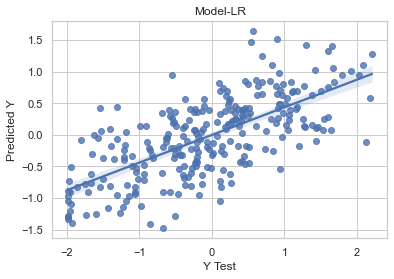

In [200]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-LR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### Cross Validation

In [201]:
for i in range(2,11):
    cv_score=cross_val_score(lr,x,y,scoring='r2',cv=i)
    cv_mean= cv_score.mean()
    cv_std= cv_score.std()
    print(f'At Cross fold {i} the cv score mean is {cv_mean*100} and the cv score std is {cv_std},testing accuracy score= {score_test*100}')
    print('\n')

At Cross fold 2 the cv score mean is 22.940129502628942 and the cv score std is 0.12843588885878726,testing accuracy score= 46.65487978802507


At Cross fold 3 the cv score mean is 24.014705660676114 and the cv score std is 0.17594668600467417,testing accuracy score= 46.65487978802507


At Cross fold 4 the cv score mean is 26.679094269175575 and the cv score std is 0.19696277604028953,testing accuracy score= 46.65487978802507


At Cross fold 5 the cv score mean is 27.90462509599751 and the cv score std is 0.18851065692314908,testing accuracy score= 46.65487978802507


At Cross fold 6 the cv score mean is 29.254679329211942 and the cv score std is 0.17906672904696636,testing accuracy score= 46.65487978802507


At Cross fold 7 the cv score mean is 26.66529952968193 and the cv score std is 0.23929948925864317,testing accuracy score= 46.65487978802507


At Cross fold 8 the cv score mean is 28.394692623543673 and the cv score std is 0.19898045849150534,testing accuracy score= 46.65487978802

##### Ploynomial with Regularisation

In [202]:
# Define the degree of polynomial features
degree = 2

# Create an instance of PolynomialFeatures
poly_features = PolynomialFeatures(degree=degree)

# Fit and transform the training features to polynomial features
X_train_poly = poly_features.fit_transform(x_train)

# Transform the testing features to polynomial features
X_test_poly = poly_features.transform(x_test)

###### Ridge

In [203]:
# Create an instance of Ridge regression
ridge_model = Ridge()

ridge_model.fit(X_train_poly, y_train)

pred_train_ridge=ridge_model.predict(X_train_poly)
pred_test_ridge = ridge_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_ridge)

# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_ridge))

R2_Score_train:  0.6098216751673633
R2_Score_test:  0.37516392699393863
RMSE =  0.7795
The mean absolute error =  0.6076649834498691


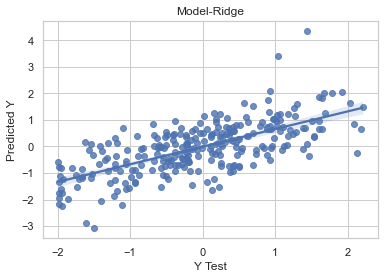

In [204]:
sns.regplot(x=y_test,y=pred_test_ridge)
plt.title("Model-Ridge")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

##### Lasso

In [205]:
# Create an instance of Lasso regression
lasso_model = Lasso()


lasso_model.fit(X_train_poly, y_train)

pred_train_lasso=lasso_model.predict(X_train_poly)
pred_test_lasso = lasso_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_lasso)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_lasso))

R2_Score_train:  0.6098216751673633
R2_Score_test:  0.37516392699393863
RMSE =  0.9888
The mean absolute error =  0.8033199629239365


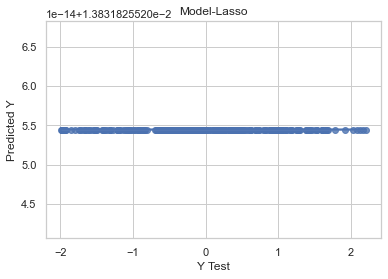

In [206]:
sns.regplot(x=y_test,y=pred_test_lasso)
plt.title("Model-Lasso")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

##### KNN

In [207]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    knn = KNeighborsRegressor()
    knn.fit(x_train,y_train)
    pred = knn.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.5057794640062578 seen for random state: 80


In [208]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=knn.predict(x_train)
pred_test = knn.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(knn, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.515630551406262
The r2 score_test is: 0.621533376559511
The mean absolute error 0.47946879655885966
The mean squared error 0.36801584775653995
The cross validation score 0.2775873518144486


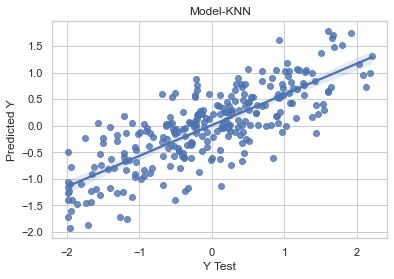

In [209]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-KNN")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

##### SVR

In [210]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    svr = SVR()
    svr.fit(x_train,y_train)
    pred = svr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.5663193647390659 seen for random state: 80


In [211]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=svr.predict(x_train)
pred_test = svr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(svr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.5726571865247415
The r2 score_test is: 0.6868468245790399
The mean absolute error 0.4001914396127946
The mean squared error 0.30450593049011243
The cross validation score 0.3807482344445441


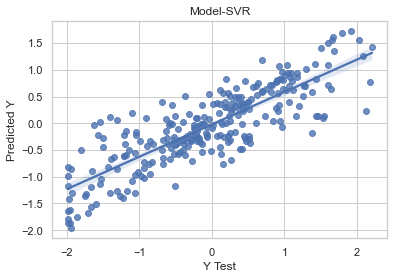

In [212]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-SVR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### Decision Tree Regressor

In [213]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
  
    dtr = DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    pred = dtr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.22042816951050082 seen for random state: 89


In [214]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

In [215]:
pred_train=dtr.predict(x_train)
pred_test= dtr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(dtr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8322665244773291
The r2 score_test is: 0.8317560151719414
The mean absolute error 0.154560604635803
The mean squared error 0.18640026725823486
The cross validation score 0.0006846931300560133


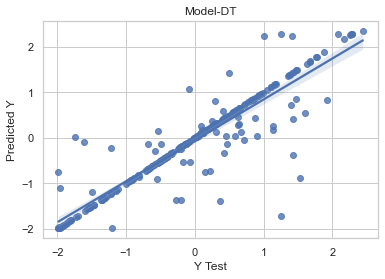

In [216]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-DT")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### Random forest Regressor

In [217]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6342076513247781 seen for random state: 12


In [218]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

In [219]:
pred_train=rfr.predict(x_train)
pred_test= rfr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(rfr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8595846551492691
The r2 score_test is: 0.8736542901567719
The mean absolute error 0.2453506901541352
The mean squared error 0.12545567759143952
The cross validation score 0.4810636714040132


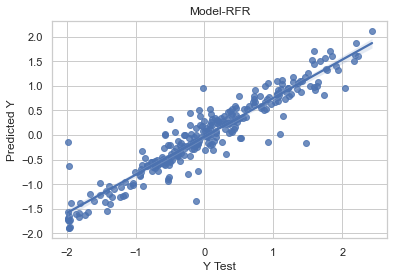

In [220]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-RFR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

#### GB Regressor

In [221]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    gbr=GradientBoostingRegressor()
    gbr.fit(x_train,y_train)
    pred=gbr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6161296090916739 seen for random state: 88


In [222]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=gbr.predict(x_train)
pred_test = gbr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(gbr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.667543865369654
The r2 score_test is: 0.7434893917074767
The mean absolute error 0.4328074746412638
The mean squared error 0.29367332225651877
The cross validation score 0.4779104771664402


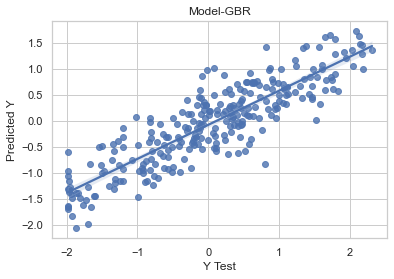

In [223]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-GBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

##### ADAB Regressor

In [224]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    
    adr=AdaBoostRegressor()
    adr.fit(x_train,y_train)
    adr_pred=adr.predict(x_test)
    acc = r2_score(y_test, adr_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.5727779851193481 seen for random state: 80


In [225]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=adr.predict(x_train)
pred_test = adr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(adr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.5223231757863165
The r2 score_test is: 0.590159483291994
The mean absolute error 0.526931496962303
The mean squared error 0.39852339905210094
The cross validation score 0.4196870867248032


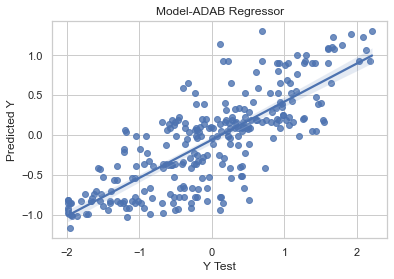

In [226]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-ADAB Regressor")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### XGB Regressor

In [227]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    xgb=XGBRegressor()
    xgb.fit(x_train,y_train)
    xgb_pred=xgb.predict(x_test)
    acc = r2_score(y_test, xgb_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.5795923767158464 seen for random state: 12


In [228]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=xgb.predict(x_train)
pred_test= xgb.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(xgb, x,y,cv=10)
print('The cross validation score', cv.mean(),cv.std())

The r2 score_train is: 0.8958117593988747
The r2 score_test is: 0.912371664359626
The mean absolute error 0.12741692114125888
The mean squared error 0.08701104483574539
The cross validation score 0.4058303569999272 0.1810609547816385


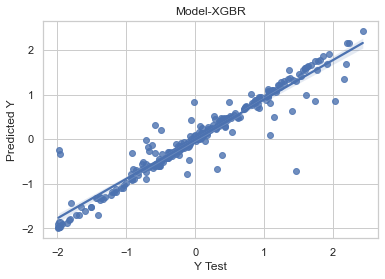

In [229]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [230]:
np.random.seed(10)

def rmse_cv(model, x, y):
    rmse = -cross_val_score(model, x, y, scoring='neg_mean_squared_error', cv=10)
    return (rmse)

models = [LinearRegression(), Ridge(), Lasso(), SVR(), KNeighborsRegressor(),
          DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor(),
          AdaBoostRegressor(), XGBRegressor()]

names = ['lr', 'ridge', 'lasso', 'svr', 'knn', 'dtr', 'rfr', 'gbr', 'adr', 'xgb']

for model, name in zip(models, names):
    score = rmse_cv(model, x, y)
    print("{}: {:.6f}, {:.6f}".format(name, score.mean(), score.std()))

lr: 0.648811, 0.164648
ridge: 0.648702, 0.164524
lasso: 1.004450, 0.322921
svr: 0.573780, 0.162428
knn: 0.665728, 0.222152
dtr: 0.914761, 0.254745
rfr: 0.477749, 0.112983
gbr: 0.476835, 0.095686
adr: 0.543822, 0.119061
xgb: 0.536128, 0.103981


##### Best Algorithm is XGB Regressor

###### Tunning the Parameters of the Model using OPTUNA and GridSearchCV

In [231]:
# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(x, y, test_size=0.2, random_state=22)

# Define the objective function to optimize using Optuna
def objective(trial):
    # Define the hyperparameters to tune
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'lambda': trial.suggest_float('lambda', 0.0, 1.0),
    }

    # Create the XGB regressor with the current hyperparameters
    model = XGBRegressor(**params)

    # Train the model
    model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], early_stopping_rounds=10, verbose=False)

    # Predict on the validation set
    y_pred = model.predict(X_valid)

    # Calculate the mean squared error as the objective to minimize
    mse = mean_squared_error(y_valid, y_pred)

    return mse

In [232]:
# Create an Optuna study object
study = optuna.create_study(direction='minimize')

# Optimize the objective function using Optuna
study.optimize(objective, n_trials=100)

# Get the best hyperparameters found by Optuna
best_params = study.best_params

[I 2023-06-18 20:55:52,168] A new study created in memory with name: no-name-c19c3713-270f-4d15-b226-26a042fe0ab2
[I 2023-06-18 20:55:52,304] Trial 0 finished with value: 0.44029815712133313 and parameters: {'n_estimators': 100, 'learning_rate': 0.133086716057233, 'max_depth': 7, 'subsample': 0.789057969583989, 'colsample_bytree': 0.7950278190814184, 'gamma': 0.7769609390379426, 'lambda': 0.6378237691380615}. Best is trial 0 with value: 0.44029815712133313.
[I 2023-06-18 20:55:52,397] Trial 1 finished with value: 0.4405662442929321 and parameters: {'n_estimators': 100, 'learning_rate': 0.1702532349479292, 'max_depth': 4, 'subsample': 0.9935276126939241, 'colsample_bytree': 0.958067811430923, 'gamma': 0.009284719318064516, 'lambda': 0.3213259949327091}. Best is trial 0 with value: 0.44029815712133313.
[I 2023-06-18 20:55:52,523] Trial 2 finished with value: 0.4286101963864065 and parameters: {'n_estimators': 100, 'learning_rate': 0.07033462801095658, 'max_depth': 3, 'subsample': 0.95454

In [233]:
# Visualize the optimization history
vis.plot_optimization_history(study).show()

# Visualize the importance of hyperparameters
vis.plot_param_importances(study).show()

# Visualize the slice of hyperparameters
vis.plot_slice(study).show()

In [234]:
# Train the final model using the best hyperparameters
final_model = XGBRegressor(**best_params)
final_model.fit(x, y)

pred_train=final_model.predict(x_train)
pred_test= final_model.predict(X_valid)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_valid, pred_test))
print('The mean absolute error ', mean_absolute_error(y_valid, pred_test))
print('mean_squared_error: ',mean_squared_error(y_valid,pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_valid,pred_test)))

The r2 score_train is:  -0.6208799731505397
The r2 score_test is:  0.7914907979765803
The mean absolute error  0.37790456118240706
mean_squared_error:  0.22451856924675456
root_mean_squared_error:  0.47383390470369946


In [235]:
# Calculate the cross-validation score with the final model
cv_scores = cross_val_score(final_model, x, y, cv=10)

# Optuna maximizes the objective function, so negate the mean squared error
avg_mse = cv_scores.mean()

print("Cross-validation score :", avg_mse)

Cross-validation score : 0.45942848666403713


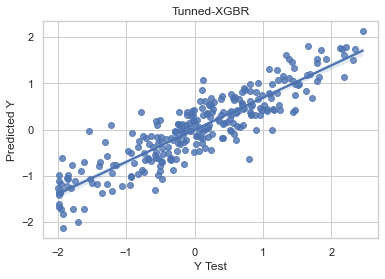

In [236]:
sns.regplot(x=y_valid,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

##### GridSearch CV

In [237]:
# Define the parameter grid
params = {
    'n_estimators': [100, 200,500,700],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3,5,7,9],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8,1]
}

xgb_tuned= GridSearchCV(XGBRegressor(),params,scoring='r2',cv =10,n_jobs=-1,verbose=True)
xgb_tuned.fit(x_train,y_train)
y_pred=xgb_tuned.predict(x_test)
print('The r2 score is:', r2_score(y_test, y_pred))
print("\n The best estimator across ALL searched params:\n", xgb_tuned.best_estimator_)
print("\n The best score across ALL searched params:\n", xgb_tuned.best_score_)
print("\n The best parameters across ALL searched params:\n",xgb_tuned.best_params_)

Fitting 10 folds for each of 192 candidates, totalling 1920 fits
The r2 score is: -0.019606022624185204

 The best estimator across ALL searched params:
 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=200, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

 The best score across ALL searched params:
 -0.04597507297774184

 The best parameters across ALL searched 

In [238]:
# Reinstating with tuned parameters
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=22)

xgb_model=XGBRegressor(n_estimators=100,max_depth=3,colsample_bytree=1,learning_rate=0.1,subsample=0.8).fit(x_train,y_train)

pred_train=xgb_model.predict(x_train)
pred_test= xgb_model.predict(x_test)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_test, pred_test))
print('The mean absolute error ', mean_absolute_error(y_test, pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

The r2 score_train is:  0.7073304385564968
The r2 score_test is:  0.5962332723035345
The mean absolute error  0.5235965244718026
root_mean_squared_error:  0.6593693930433406


In [239]:
cv = cross_val_score(xgb_model, x,y,cv=10)
print('The cross validation score', cv.mean())

The cross validation score 0.4775942843123982


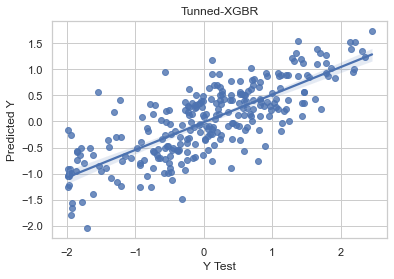

In [240]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

###### Conclusion:
After using two different techniques of tunning the parameters of XGB regressor Algorithm. {GridSearchCV & OPTUNA}

The OPTUNA one was better than GridSearch in all the evaluation metrics also in the cross validation performance, But the orginal XGB Model before tunning is the best one in all the evaluation metrics but not in the CV as it score almost 53% Therefor i will go with the Orginal XGB regressor Model to be my Final used Model.

Evaluation Metrics & CV results:

The r2 score_train is: 0.7073304385564968 The r2 score_test is: 0.5962332723035345

The mean absolute error 0.5235965244718026

The mean squared error  0.6593693930433406

The cross validation score 0.6593693930433406 0.4775942843123982

###### Saving the Model

In [241]:
#Saving the model using .pkl
joblib.dump(xgb,'Gross_XGB.pkl')

['Gross_XGB.pkl']

In [242]:
# load model and get predictions

model=joblib.load('Gross_XGB.pkl')

In [243]:
#Predict

prediction= model.predict(x_test)

pd.DataFrame([model.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,...,265,266,267,268,269,270,271,272,273,274
Predicted,-0.265039,1.213289,-1.495083,0.444736,-0.010879,-0.024331,1.293408,1.709449,0.611922,0.040439,...,-1.975107,-0.590334,-1.263836,-1.972849,1.203973,-0.560421,-0.397989,-0.188094,-0.820015,1.288819
Original,-0.279834,1.206801,-1.522792,0.426866,0.625339,-0.236849,1.440143,1.709875,0.669726,-0.037901,...,-1.969093,-0.628147,-0.272502,-1.972100,1.205230,-0.526486,0.119789,-0.147993,-0.382563,1.313916


###### The Results are very good 

##### Thank You